# Acea Smart Water Analytics

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/nn-pic/NNs.jpg
/kaggle/input/acea-water-prediction/Aquifer_Doganella.csv
/kaggle/input/acea-water-prediction/Aquifer_Auser.csv
/kaggle/input/acea-water-prediction/Water_Spring_Amiata.csv
/kaggle/input/acea-water-prediction/datasets_description.ods
/kaggle/input/acea-water-prediction/Lake_Bilancino.csv
/kaggle/input/acea-water-prediction/datasets_description.xlsx
/kaggle/input/acea-water-prediction/Water_Spring_Madonna_di_Canneto.csv
/kaggle/input/acea-water-prediction/Aquifer_Luco.csv
/kaggle/input/acea-water-prediction/Aquifer_Petrignano.csv
/kaggle/input/acea-water-prediction/Water_Spring_Lupa.csv
/kaggle/input/acea-water-prediction/River_Arno.csv


In [2]:
# Installing the missingpy library which will  be used for data imputation

In [3]:
pip install missingpy

     |████████████████████████████████| 49 kB 462 kB/s 
You should consider upgrading via the '/opt/conda/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [4]:
# Importing the required libraries

from IPython.display import Image
import matplotlib.pyplot as plt
import datetime
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
from math import *
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from missingpy import MissForest
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
import shap
from lightgbm import LGBMRegressor
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from sklearn.preprocessing import MinMaxScaler
from timeit import default_timer as timer

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [5]:
# Creating a list of colours that will be used for plotting throughout the notebook

colours = ['black', 'brown', 'red', 'orange', 'gold',
          'yellow', 'green', 'blue', 'violet', 'crimson',
          'maroon', 'lime', 'azure', 'indigo']

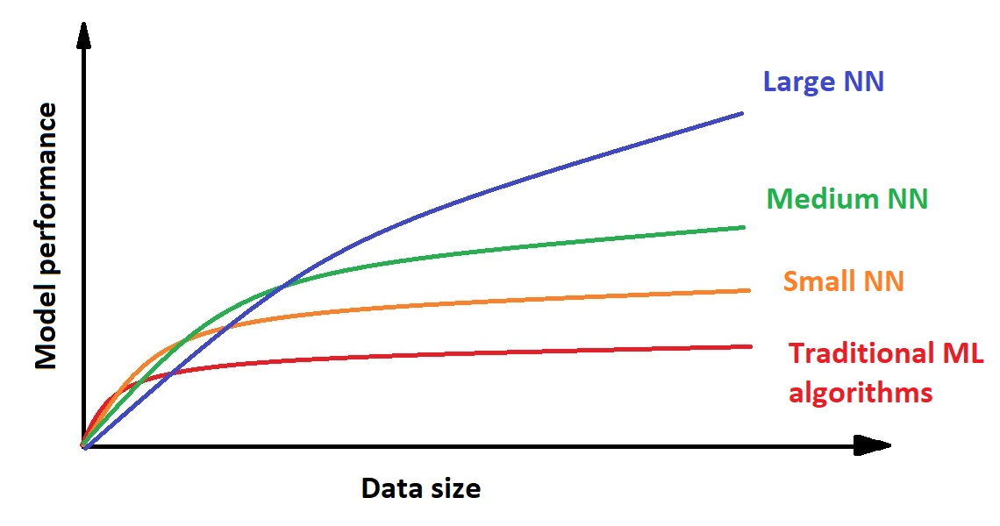

In [6]:
Image("../input/nn-pic/NNs.jpg", width=500, height=50)

# Aquifer Petrignano

In [7]:
# Load the dataset
train = pd.read_csv('../input/acea-water-prediction/Aquifer_Petrignano.csv', parse_dates=['Date'], dayfirst=True)
# Create a copy of the original data, since the 'train' dataframe will be modified
train_orig = train.copy()

In [8]:
train.head()

,Date,Rainfall_Bastia_Umbra,Depth_to_Groundwater_P24,Depth_to_Groundwater_P25,Temperature_Bastia_Umbra,Temperature_Petrignano,Volume_C10_Petrignano,Hydrometry_Fiume_Chiascio_Petrignano
0,2006-03-14,NaN,-22.48,-22.18,NaN,NaN,NaN,NaN
1,2006-03-15,NaN,-22.38,-22.14,NaN,NaN,NaN,NaN
2,2006-03-16,NaN,-22.25,-22.04,NaN,NaN,NaN,NaN
3,2006-03-17,NaN,-22.38,-22.04,NaN,NaN,NaN,NaN
4,2006-03-18,NaN,-22.60,-22.04,NaN,NaN,NaN,NaN


In [9]:
train.tail()

,Date,Rainfall_Bastia_Umbra,Depth_to_Groundwater_P24,Depth_to_Groundwater_P25,Temperature_Bastia_Umbra,Temperature_Petrignano,Volume_C10_Petrignano,Hydrometry_Fiume_Chiascio_Petrignano
5218,2020-06-26,0.0,-25.68,-25.07,25.7,24.5,-29930.688,2.5
5219,2020-06-27,0.0,-25.80,-25.11,26.2,25.0,-31332.960,2.4
5220,2020-06-28,0.0,-25.80,-25.19,26.9,25.7,-32120.928,2.4
5221,2020-06-29,0.0,-25.78,-25.18,26.9,26.0,-30602.880,2.4
5222,2020-06-30,0.0,-25.91,-25.25,27.3,26.5,-31878.144,2.4


In [10]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5223 entries, 0 to 5222
Data columns (total 8 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Date                                  5223 non-null   datetime64[ns]
 1   Rainfall_Bastia_Umbra                 4199 non-null   float64       
 2   Depth_to_Groundwater_P24              5168 non-null   float64       
 3   Depth_to_Groundwater_P25              5184 non-null   float64       
 4   Temperature_Bastia_Umbra              4199 non-null   float64       
 5   Temperature_Petrignano                4199 non-null   float64       
 6   Volume_C10_Petrignano                 5025 non-null   float64       
 7   Hydrometry_Fiume_Chiascio_Petrignano  4199 non-null   float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 326.6 KB


In [11]:
targets = ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']

In [12]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

In [13]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [14]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

vol_df = train.filter(regex=("Volume.*"))
vols = vol_df.columns.tolist()
vol_df.insert(0, column = 'Date', value = train['Date'])

temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

depth_df = train.filter(regex=("Depth_to_Groundwater.*"))
depths = depth_df.columns.tolist()
depth_df.insert(0, column = 'Date', value = train['Date'])

hydro_df = train.filter(regex=("Hydrometry.*"))
hydros = hydro_df.columns.tolist()
hydro_df.insert(0, column = 'Date', value = train['Date'])

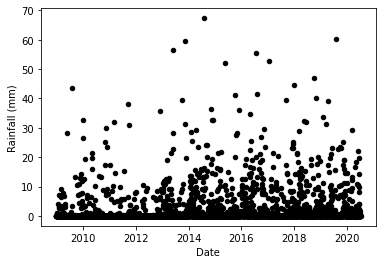

In [15]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

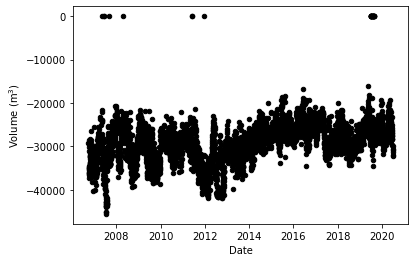

In [16]:
if len(vols)>0:
    i = 0
    while i<len(vols):
        if i == 0:
            ax1 = vol_df.plot.scatter(x = 'Date', y = f'{vols[i]}', color=colours[i])
        else:
            axes = vol_df.plot.scatter(x = 'Date', y = f'{vols[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Volume (m$^3$)')
        i += 1

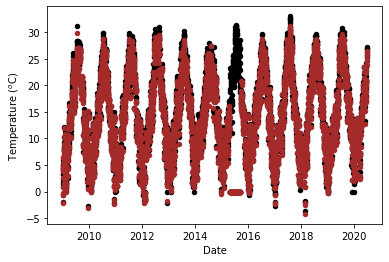

In [17]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

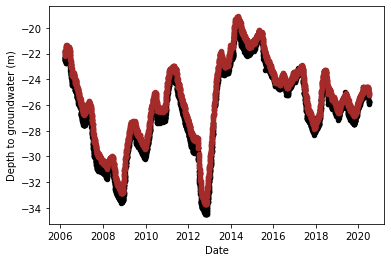

In [18]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

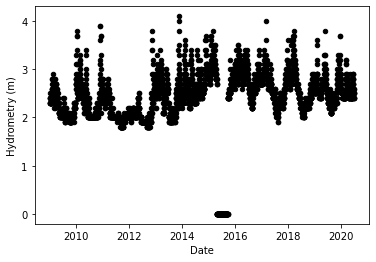

In [19]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [20]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [21]:
if len(vols)>0:
    i = 0
    while i<len(vols):
        train[f'{vols[i]}'] = train[f'{vols[i]}'].fillna(0)
        i += 1

In [22]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column   


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


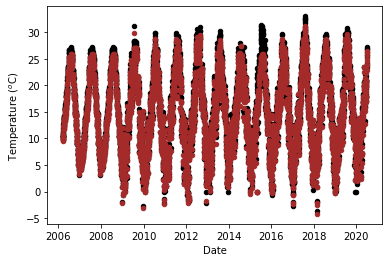

In [23]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [24]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        train[f'{hydros[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in hydros are errors, so replace them with Nans
    hydro_df2 = train.filter(regex=("Hydrometry.*"))
    hydros = hydro_df2.columns.tolist()
    hydro_df2.insert(0, column = 'Date', value = train['Date'])

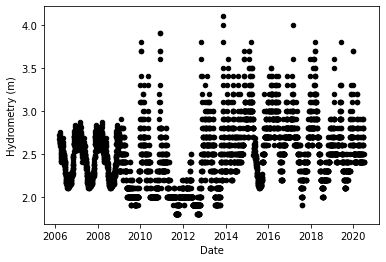

In [25]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        X = pd.DataFrame(hydro_df2.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{hydros[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{hydros[i]}'].to_dict())
        X.loc[X[f'{hydros[i]}'].isnull() == False, 'same_day'] = X[f'{hydros[i]}']
        X.loc[X[f'{hydros[i]}'].isnull() == True, f'{hydros[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{hydros[i]}'].isnull() == False, f'{hydros[i]}' + '_new'] = X[f'{hydros[i]}']
    
        train[f'{hydros[i]}'].update(X[f'{hydros[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [26]:
imputer = MissForest()
train_copy = train_orig.copy()
if len(depths)>0:
    i = 0
    while i<len(depths):
        train_copy[f'{depths[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in depths are errors, so replace them with Nans
    train_copy = train_copy.drop(['Date'], axis=1)
    col_list = list(train_copy)
    imputs = imputer.fit_transform(train_copy)
    imputs = pd.DataFrame(data=imputs, columns=col_list)
    imputs['Date']= train_orig['Date']


Iteration: 0
Iteration: 1


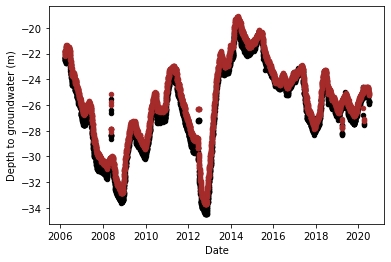

In [27]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        X = pd.DataFrame(depth_df.iloc[:, np.r_[0,i+1]])
        X.loc[X[f'{depths[i]}'].isnull() == True, f'{depths[i]}' + '_new'] =\
        X['Date'].map(imputs.set_index('Date')[f'{depths[i]}'].to_dict())
        X.loc[X[f'{depths[i]}'].isnull() == False, f'{depths[i]}' + '_new'] = X[f'{depths[i]}']
        train[f'{depths[i]}'] = X[f'{depths[i]}' + '_new']
        i += 1
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

In [28]:
days_ahead = 7

In [29]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs

In [30]:
train_rf = train.copy()

In [31]:
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(vols)>0:
    for v in vols:
        train_rf[v + '_roll_030'] = train_rf[v].rolling(30).mean().astype('float32')
        train_rf[v + '_roll_060'] = train_rf[v].rolling(60).mean().astype('float32')
        train_rf[v + '_roll_090'] = train_rf[v].rolling(90).mean().astype('float32')
        train_rf[v + '_roll_120'] = train_rf[v].rolling(120).mean().astype('float32')
        train_rf[v + '_roll_150'] = train_rf[v].rolling(150).mean().astype('float32')
        train_rf[v + '_roll_180'] = train_rf[v].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(hydros)>0:
    for h in hydros:
        train_rf[h + '_week_lag'] = train_rf[h].shift(7).astype('float32')
        train_rf[h + '_month_lag'] = train_rf[h].shift(30).astype('float32')
        train_rf[h + '_bimonth_lag'] = train_rf[h].shift(60).astype('float32')
        train_rf[h + '_quarter_lag'] = train_rf[h].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')


In [32]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [33]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [34]:
start_rf = timer()
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)
end_rf = timer()
print("Time taken = " + str(end_rf - start_rf) + ' s')

Time taken = 11.50230279500002 s


In [35]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [36]:
start_rf = timer()
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)
end_rf = timer()
print("Time taken = " + str(end_rf - start_rf) + ' s')

Time taken = 3.7152545109999835 s


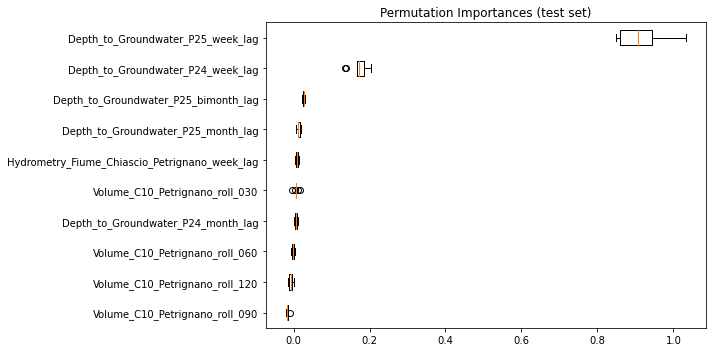

In [37]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [38]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([0.33984815, 0.27063138])

In [39]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([0.46955486, 0.40584075])

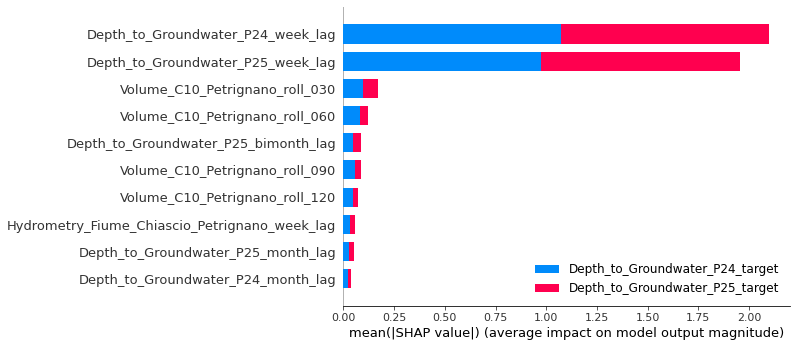

In [40]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [41]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

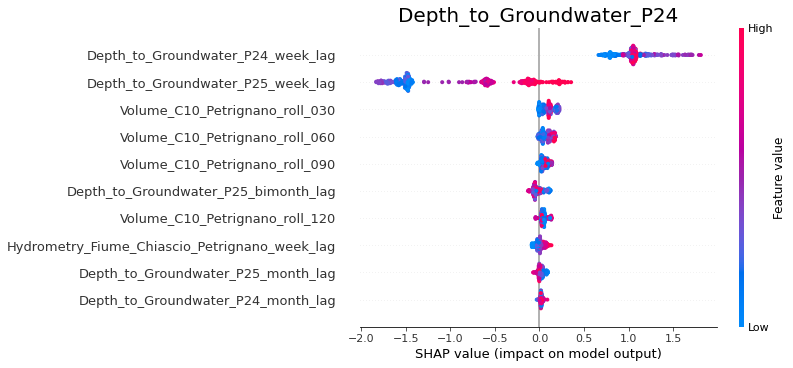

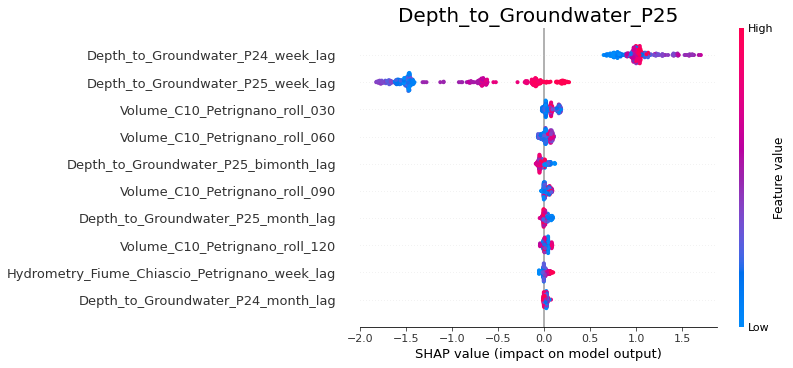

In [42]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [43]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

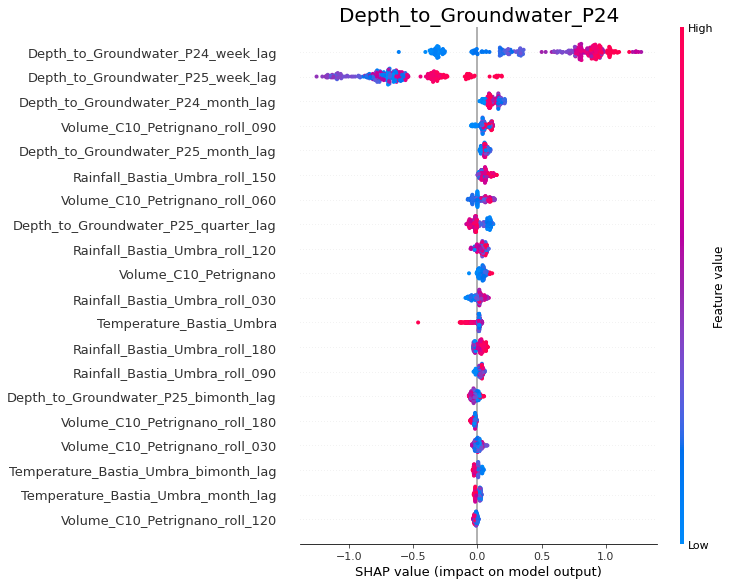

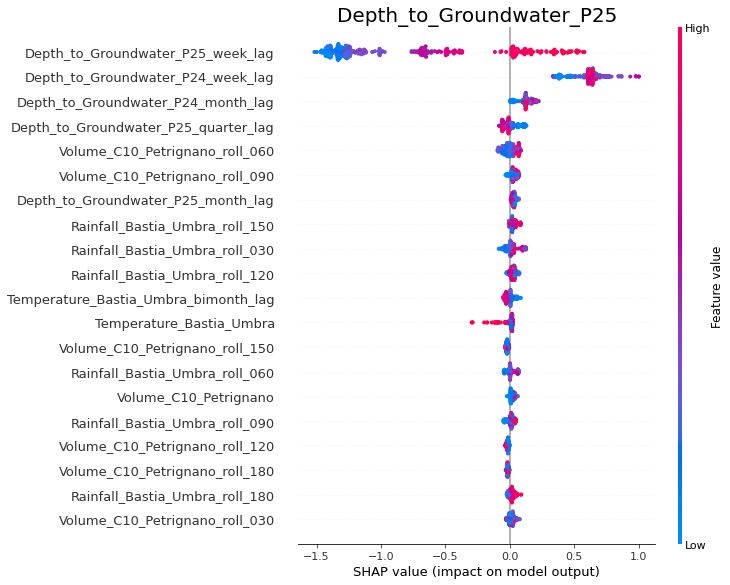

Time taken = 2.013026228000001 s


In [44]:
i = 0
start_lgbm = timer()
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1
end_lgbm = timer()
print("Time taken = " + str(end_lgbm - start_lgbm) + ' s')

In [45]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([0.39717598, 0.26274079])

In [46]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([0.49585489, 0.38123535])

In [47]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [48]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(4848, 7, 7) (4848, 2)
(352, 7, 7) (352, 2)


In [49]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

start_lstm = timer()

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

end_lstm = timer()
print("Time taken = " + str(end_lstm - start_lstm) + ' s')

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

Time taken = 290.924453879 s


In [50]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.26255539, 0.19024503])

In [51]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([0.43303533, 0.36456403])

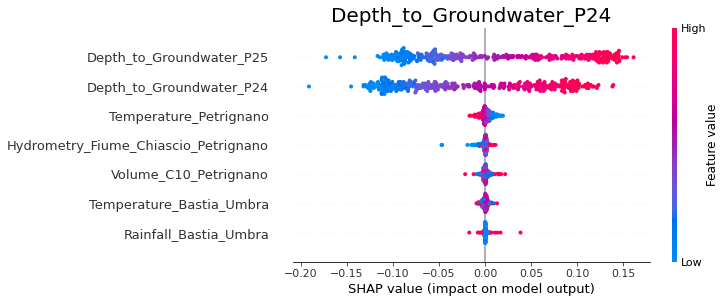

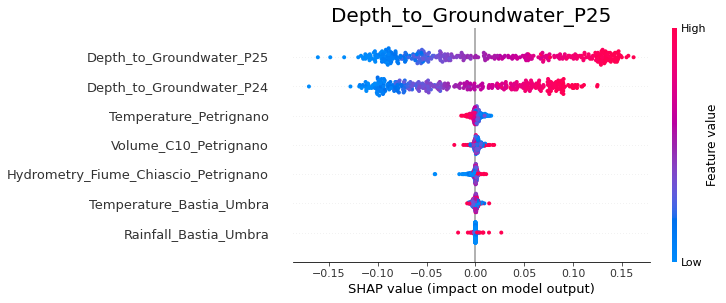

In [52]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [53]:
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [54]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([0.34249414, 0.27246885])

In [55]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([0.40122178, 0.26643753])

In [56]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.26255539, 0.19024503])

In [57]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([0.28345329, 0.18906165])

In [58]:
days_ahead = 30

In [59]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs


In [60]:
train_rf = train.copy()

In [61]:
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(vols)>0:
    for v in vols:
        train_rf[v + '_roll_030'] = train_rf[v].rolling(30).mean().astype('float32')
        train_rf[v + '_roll_060'] = train_rf[v].rolling(60).mean().astype('float32')
        train_rf[v + '_roll_090'] = train_rf[v].rolling(90).mean().astype('float32')
        train_rf[v + '_roll_120'] = train_rf[v].rolling(120).mean().astype('float32')
        train_rf[v + '_roll_150'] = train_rf[v].rolling(150).mean().astype('float32')
        train_rf[v + '_roll_180'] = train_rf[v].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(hydros)>0:
    for h in hydros:
        train_rf[h + '_week_lag'] = train_rf[h].shift(7).astype('float32')
        train_rf[h + '_month_lag'] = train_rf[h].shift(30).astype('float32')
        train_rf[h + '_bimonth_lag'] = train_rf[h].shift(60).astype('float32')
        train_rf[h + '_quarter_lag'] = train_rf[h].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')

In [62]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [63]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [64]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

RandomForestRegressor(max_depth=30, random_state=2)

In [65]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [66]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

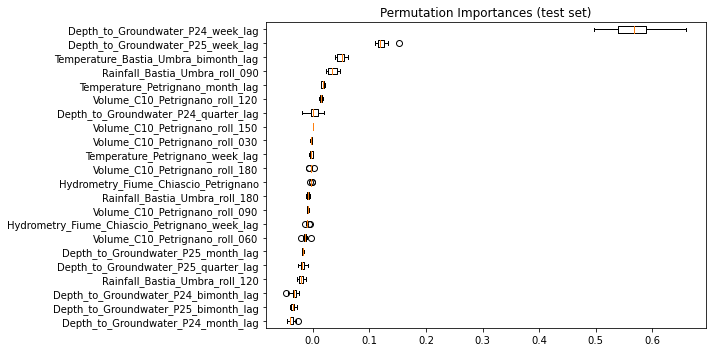

In [67]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [68]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([0.50097733, 0.41371918])

In [69]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([0.61893727, 0.52696985])

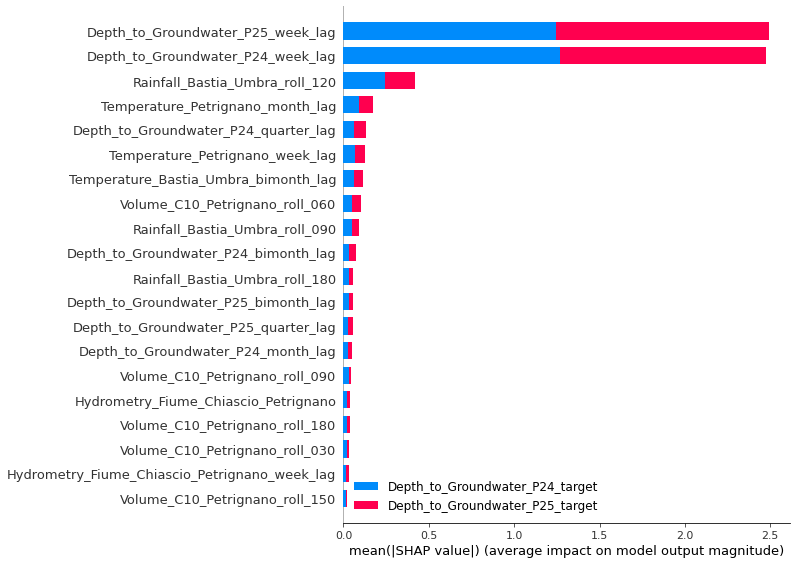

In [70]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [71]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

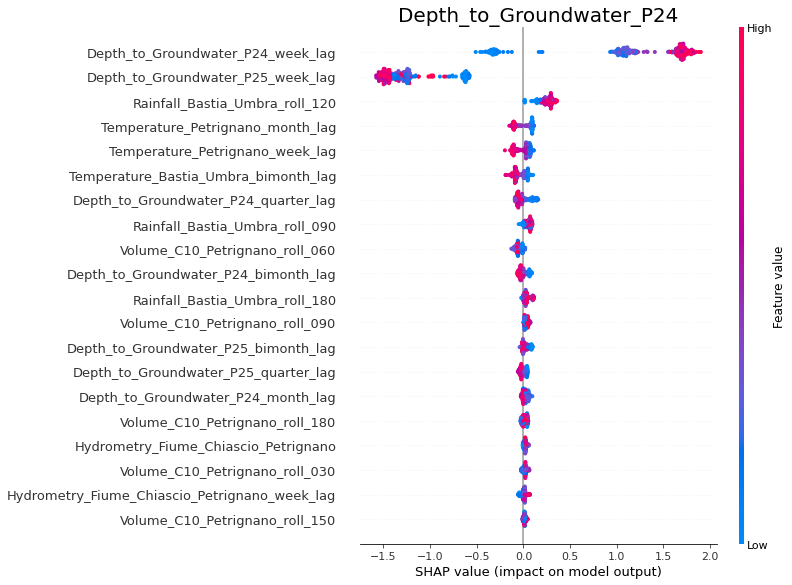

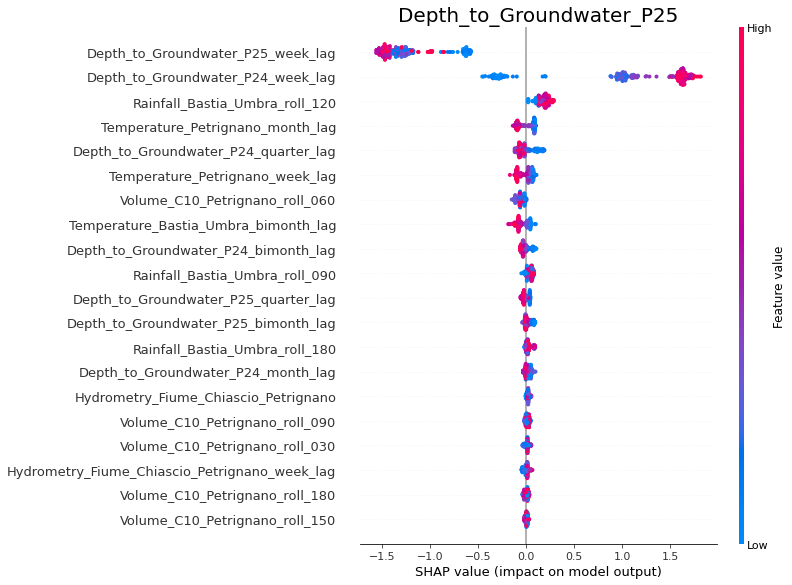

In [72]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [73]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

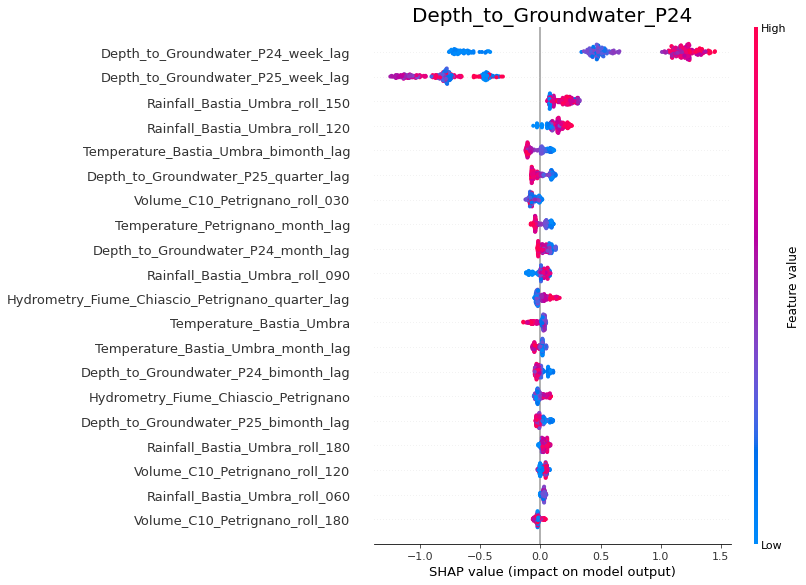

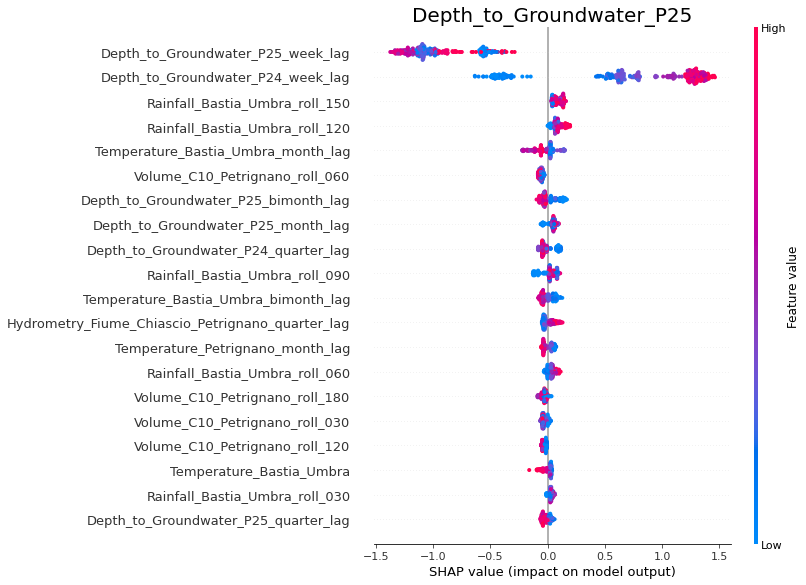

In [74]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [75]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([0.43709588, 0.38181835])

In [76]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([0.54241152, 0.48519698])

In [77]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [78]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(4848, 7, 7) (4848, 2)
(322, 7, 7) (322, 2)


In [79]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [80]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.33034687, 0.27278379])

In [81]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([0.45963329, 0.39519266])

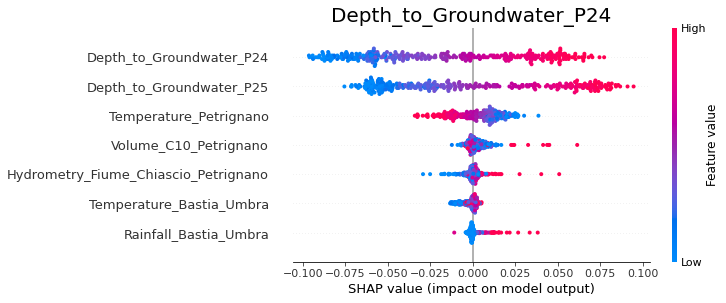

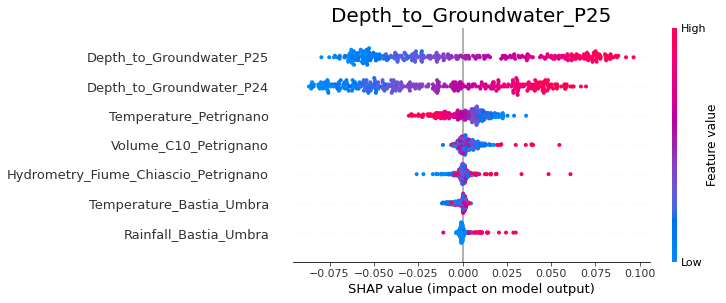

In [82]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [83]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [84]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([0.50372123, 0.41599185])

In [85]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([0.44017532, 0.38506032])

In [86]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.33034687, 0.27278379])

In [87]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([0.35777679, 0.30511711])

# Aquifer Auser

In [88]:
# Load the dataset
train = pd.read_csv('../input/acea-water-prediction/Aquifer_Auser.csv', parse_dates=['Date'], dayfirst=True)
# Create a copy of the original data, since the 'train' dataframe will be modified
train_orig = train.copy()
train.head()

,Date,Rainfall_Gallicano,Rainfall_Pontetetto,Rainfall_Monte_Serra,Rainfall_Orentano,Rainfall_Borgo_a_Mozzano,Rainfall_Piaggione,Rainfall_Calavorno,Rainfall_Croce_Arcana,Rainfall_Tereglio_Coreglia_Antelminelli,...,Temperature_Monte_Serra,Temperature_Ponte_a_Moriano,Temperature_Lucca_Orto_Botanico,Volume_POL,Volume_CC1,Volume_CC2,Volume_CSA,Volume_CSAL,Hydrometry_Monte_S_Quirico,Hydrometry_Piaggione
0,1998-03-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1998-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,10.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1998-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.2,0.0,10.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1998-03-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.4,0.0,13.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1998-03-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.4,0.0,12.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
train.tail()

,Date,Rainfall_Gallicano,Rainfall_Pontetetto,Rainfall_Monte_Serra,Rainfall_Orentano,Rainfall_Borgo_a_Mozzano,Rainfall_Piaggione,Rainfall_Calavorno,Rainfall_Croce_Arcana,Rainfall_Tereglio_Coreglia_Antelminelli,...,Temperature_Monte_Serra,Temperature_Ponte_a_Moriano,Temperature_Lucca_Orto_Botanico,Volume_POL,Volume_CC1,Volume_CC2,Volume_CSA,Volume_CSAL,Hydrometry_Monte_S_Quirico,Hydrometry_Piaggione
8149,2020-06-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,20.75,0.0,23.75,-7189.406533,-7847.900,-9183.433333,-6115.40,-3158.0,0.20,-1.03
8150,2020-06-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,21.35,0.0,24.30,-7189.406533,-7847.900,-9183.433333,-6115.40,-3158.0,0.21,-1.03
8151,2020-06-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,21.75,0.0,24.55,-6829.936207,-7455.505,-8724.261667,-5809.63,-3000.1,0.23,-1.03
8152,2020-06-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,18.90,0.0,23.60,-7189.406533,-7847.900,-9183.433333,-6115.40,-3158.0,0.23,-1.02
8153,2020-06-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,19.90,0.0,25.05,-7189.406533,-7847.900,-9183.433333,-6115.40,-3158.0,0.21,-1.05


In [90]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8154 entries, 0 to 8153
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       5295 non-null   float64       
 2   Rainfall_Pontetetto                      5295 non-null   float64       
 3   Rainfall_Monte_Serra                     5289 non-null   float64       
 4   Rainfall_Orentano                        5295 non-null   float64       
 5   Rainfall_Borgo_a_Mozzano                 5295 non-null   float64       
 6   Rainfall_Piaggione                       4930 non-null   float64       
 7   Rainfall_Calavorno                       5295 non-null   float64       
 8   Rainfall_Croce_Arcana                    5295 non-null   float64       
 9   Rainfall_Tereglio_Coreglia_Antelminelli  

In [91]:
targets = ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']

In [92]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

In [93]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [94]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

vol_df = train.filter(regex=("Volume.*"))
vols = vol_df.columns.tolist()
vol_df.insert(0, column = 'Date', value = train['Date'])

temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

depth_df = train.filter(regex=("Depth_to_Groundwater.*"))
depths = depth_df.columns.tolist()
depth_df.insert(0, column = 'Date', value = train['Date'])

hydro_df = train.filter(regex=("Hydrometry.*"))
hydros = hydro_df.columns.tolist()
hydro_df.insert(0, column = 'Date', value = train['Date'])

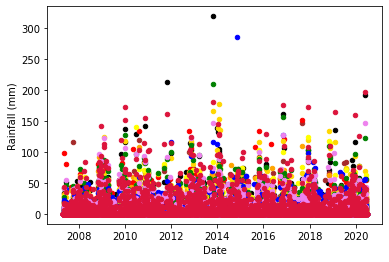

In [95]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

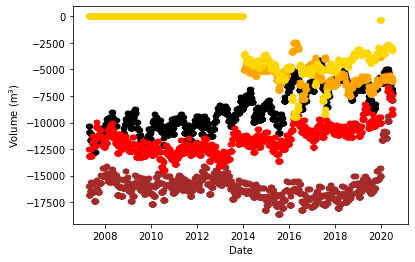

In [96]:
if len(vols)>0:
    i = 0
    while i<len(vols):
        if i == 0:
            ax1 = vol_df.plot.scatter(x = 'Date', y = f'{vols[i]}', color=colours[i])
        else:
            axes = vol_df.plot.scatter(x = 'Date', y = f'{vols[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Volume (m$^3$)')
        i += 1

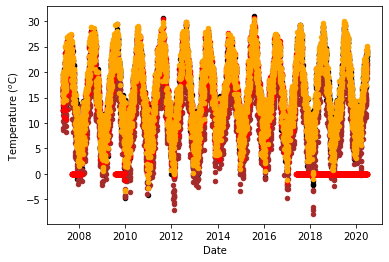

In [97]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

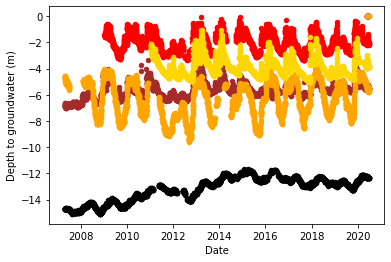

In [98]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

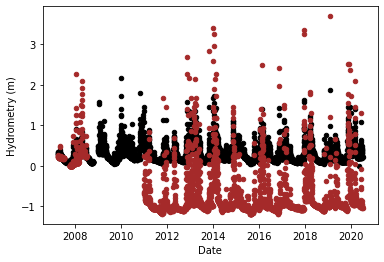

In [99]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [100]:
train.loc[train['Date'] == '2011-01-01']

,Date,Rainfall_Gallicano,Rainfall_Pontetetto,Rainfall_Monte_Serra,Rainfall_Orentano,Rainfall_Borgo_a_Mozzano,Rainfall_Piaggione,Rainfall_Calavorno,Rainfall_Croce_Arcana,Rainfall_Tereglio_Coreglia_Antelminelli,...,Temperature_Monte_Serra,Temperature_Ponte_a_Moriano,Temperature_Lucca_Orto_Botanico,Volume_POL,Volume_CC1,Volume_CC2,Volume_CSA,Volume_CSAL,Hydrometry_Monte_S_Quirico,Hydrometry_Piaggione
1363,2011-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,...,3.6,6.4,4.9,-10080.64516,-16485.10963,-13875.84,0.0,0.0,0.5,-0.33


In [101]:
train.iloc[1355:1370,-1]

1355     NaN
1356     NaN
1357     NaN
1358     NaN
1359     NaN
1360     NaN
1361     NaN
1362     NaN
1363   -0.33
1364   -0.48
1365   -0.51
1366   -0.64
1367   -0.70
1368   -0.67
1369    0.23
Name: Hydrometry_Piaggione, dtype: float64

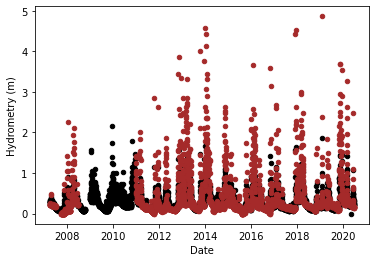

In [102]:
first_part_min = train.iloc[:1363,-1].min()
second_part_min = train.iloc[1363:,-1].min()
train.iloc[1363:,-1] = train.iloc[1363:,-1] + (first_part_min - second_part_min)
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [103]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [104]:
if len(vols)>0:
    i = 0
    while i<len(vols):
        train[f'{vols[i]}'] = train[f'{vols[i]}'].fillna(0)
        i += 1

In [105]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column   


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

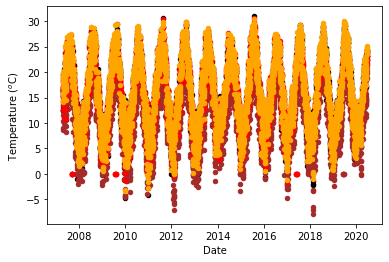

In [106]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [107]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        train[f'{hydros[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in hydros are errors, so replace them with Nans
    hydro_df2 = train.filter(regex=("Hydrometry.*"))
    hydros = hydro_df2.columns.tolist()
    hydro_df2.insert(0, column = 'Date', value = train['Date'])

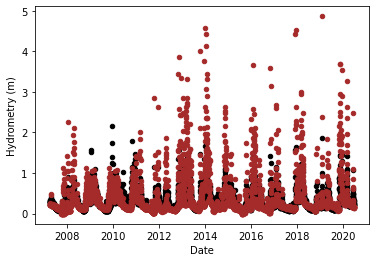

In [108]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        X = pd.DataFrame(hydro_df2.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{hydros[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{hydros[i]}'].to_dict())
        X.loc[X[f'{hydros[i]}'].isnull() == False, 'same_day'] = X[f'{hydros[i]}']
        X.loc[X[f'{hydros[i]}'].isnull() == True, f'{hydros[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{hydros[i]}'].isnull() == False, f'{hydros[i]}' + '_new'] = X[f'{hydros[i]}']
    
        train[f'{hydros[i]}'].update(X[f'{hydros[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [109]:
imputer = MissForest()
train_copy = train_orig.copy()
if len(depths)>0:
    i = 0
    while i<len(depths):
        train_copy[f'{depths[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in depths are errors, so replace them with Nans
    train_copy = train_copy.drop(['Date'], axis=1)
    col_list = list(train_copy)
    imputs = imputer.fit_transform(train_copy)
    imputs = pd.DataFrame(data=imputs, columns=col_list)
    imputs['Date']= train_orig['Date']

Iteration: 0
Iteration: 1
Iteration: 2


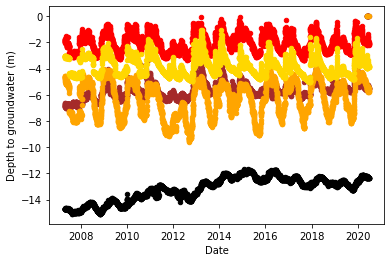

In [110]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        X = pd.DataFrame(depth_df.iloc[:, np.r_[0,i+1]])
        X.loc[X[f'{depths[i]}'].isnull() == True, f'{depths[i]}' + '_new'] =\
        X['Date'].map(imputs.set_index('Date')[f'{depths[i]}'].to_dict())
        X.loc[X[f'{depths[i]}'].isnull() == False, f'{depths[i]}' + '_new'] = X[f'{depths[i]}']
        train[f'{depths[i]}'] = X[f'{depths[i]}' + '_new']
        i += 1
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

In [111]:
days_ahead = 7

In [112]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs

In [113]:
train_rf = train.copy()

In [114]:
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(vols)>0:
    for v in vols:
        train_rf[v + '_roll_030'] = train_rf[v].rolling(30).mean().astype('float32')
        train_rf[v + '_roll_060'] = train_rf[v].rolling(60).mean().astype('float32')
        train_rf[v + '_roll_090'] = train_rf[v].rolling(90).mean().astype('float32')
        train_rf[v + '_roll_120'] = train_rf[v].rolling(120).mean().astype('float32')
        train_rf[v + '_roll_150'] = train_rf[v].rolling(150).mean().astype('float32')
        train_rf[v + '_roll_180'] = train_rf[v].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(hydros)>0:
    for h in hydros:
        train_rf[h + '_week_lag'] = train_rf[h].shift(7).astype('float32')
        train_rf[h + '_month_lag'] = train_rf[h].shift(30).astype('float32')
        train_rf[h + '_bimonth_lag'] = train_rf[h].shift(60).astype('float32')
        train_rf[h + '_quarter_lag'] = train_rf[h].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')

In [115]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [116]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [117]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

RandomForestRegressor(max_depth=30, random_state=2)

In [118]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [119]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

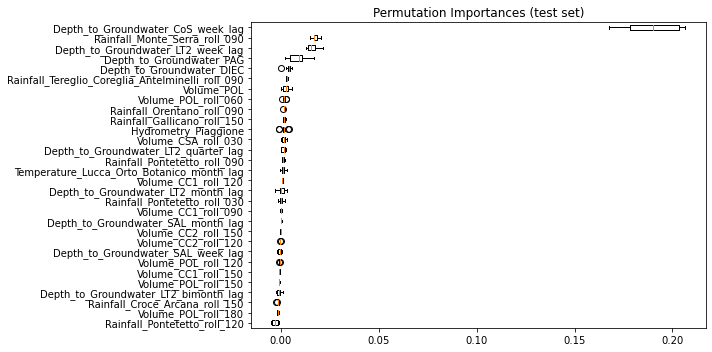

In [120]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [121]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([0.38597794, 0.47298518, 0.20930783])

In [122]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([1.00329012, 0.78188663, 0.94185252])

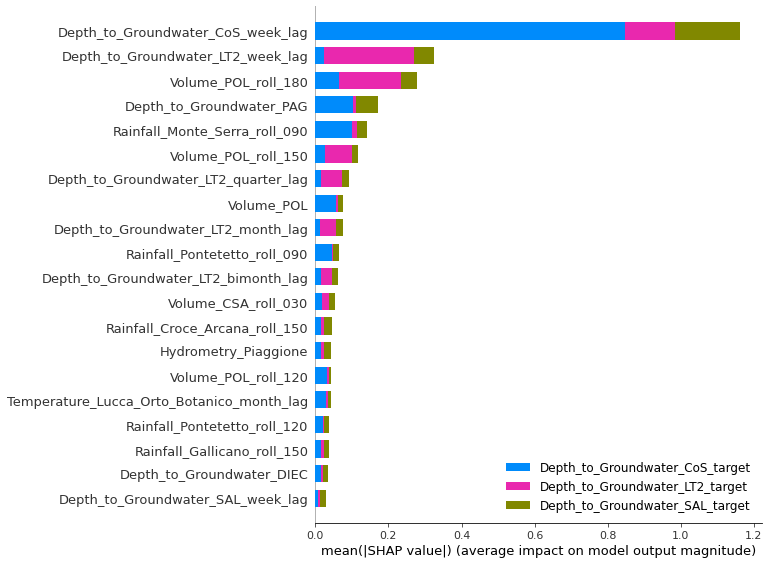

In [123]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [124]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

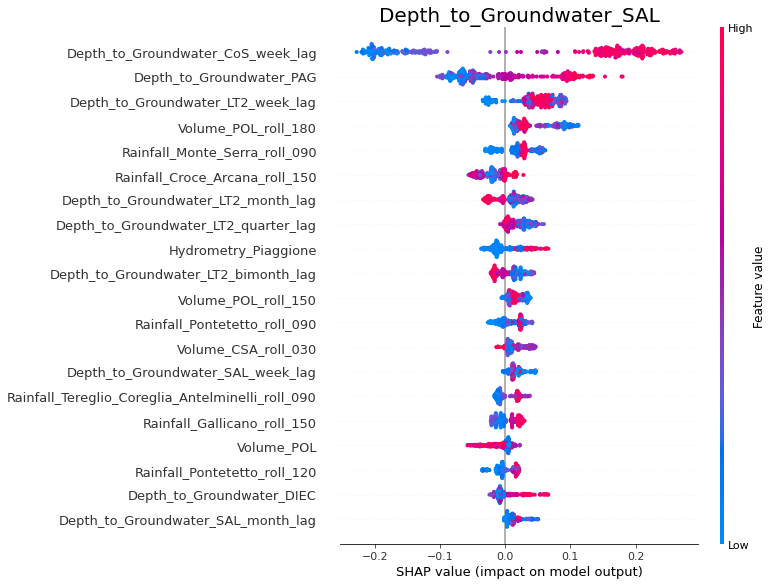

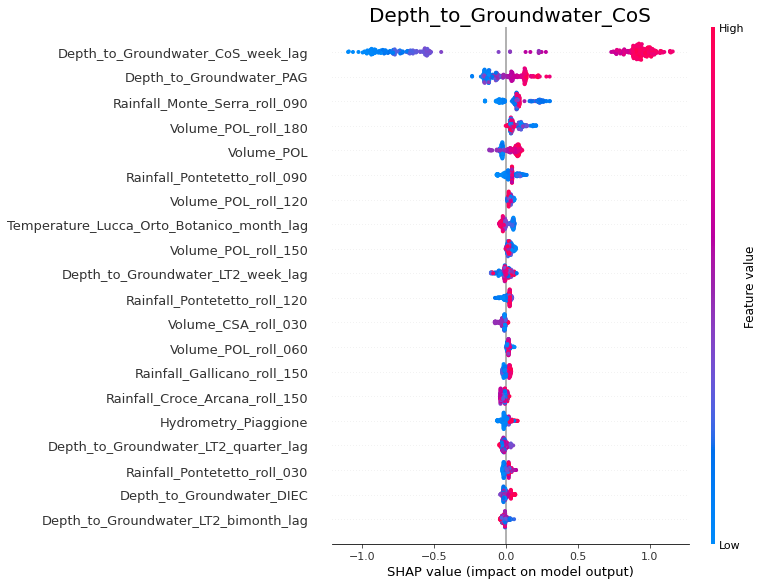

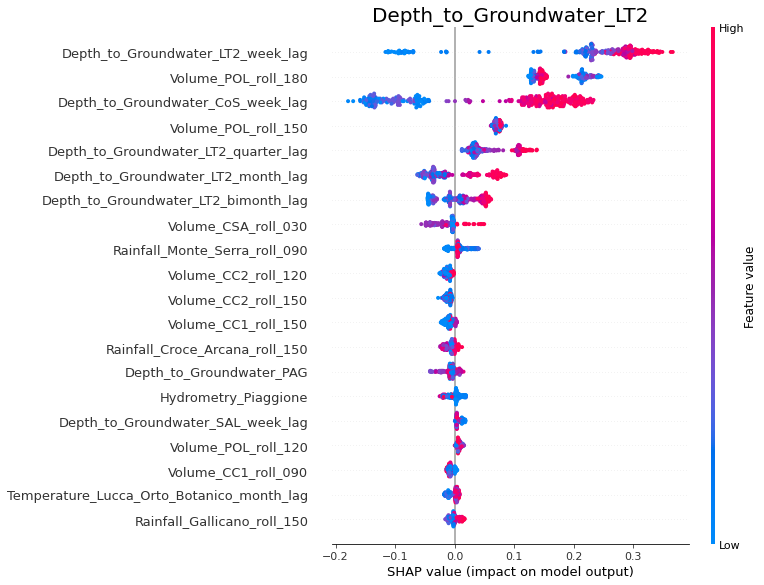

In [125]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [126]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

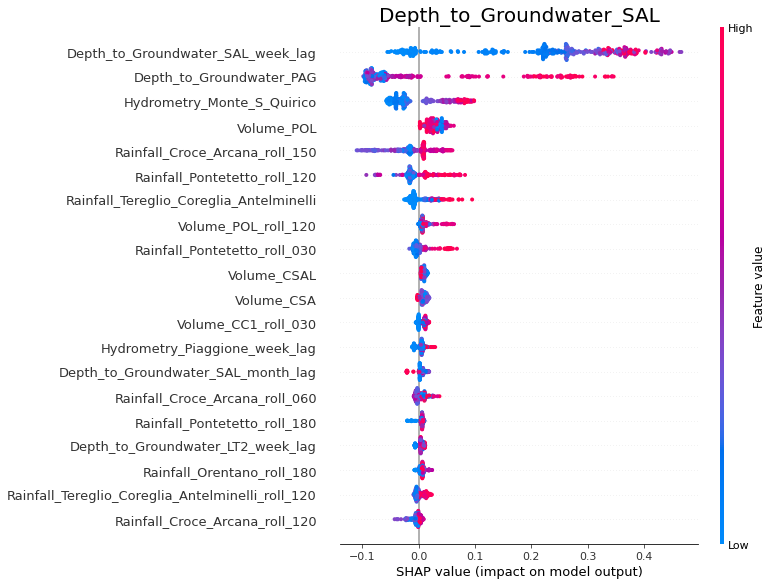

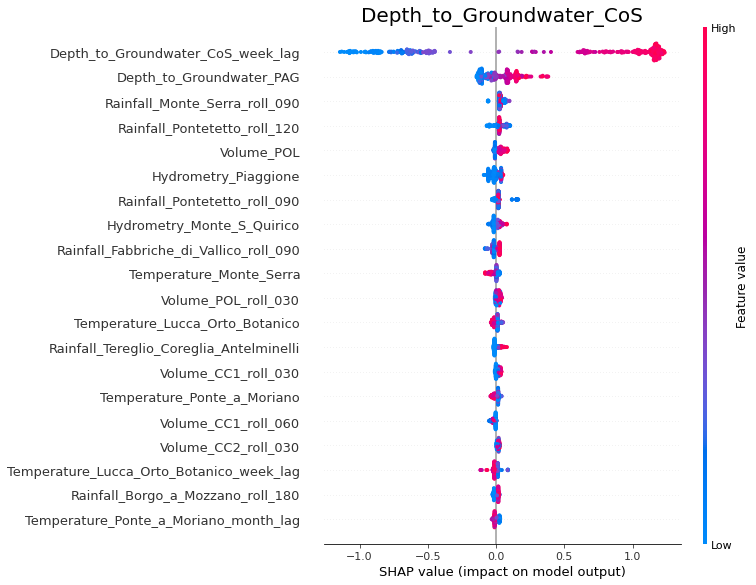

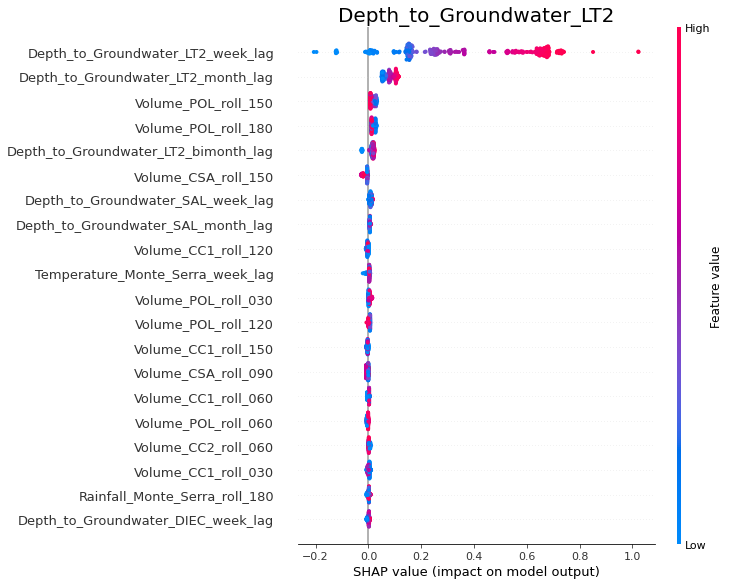

In [127]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [128]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([0.3276491 , 0.31548007, 0.18719329])

In [129]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([0.94046454, 0.6909422 , 0.93788301])

In [130]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [131]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(4458, 7, 26) (4458, 3)
(352, 7, 26) (352, 3)


In [132]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [133]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([1.37654906, 1.96314825, 3.08307201])

In [134]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([1.49951573, 2.19666699, 3.27516323])

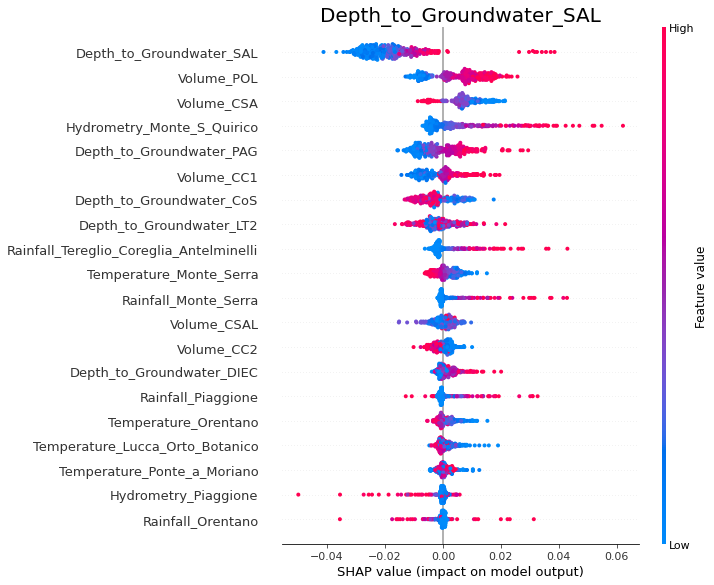

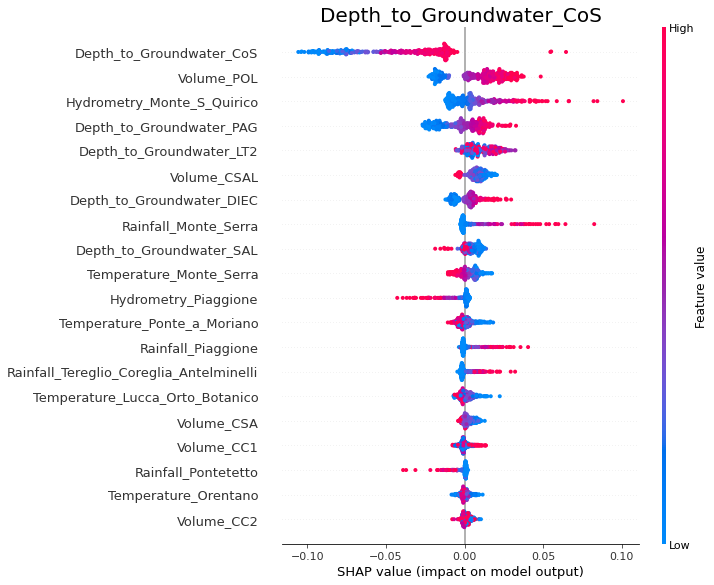

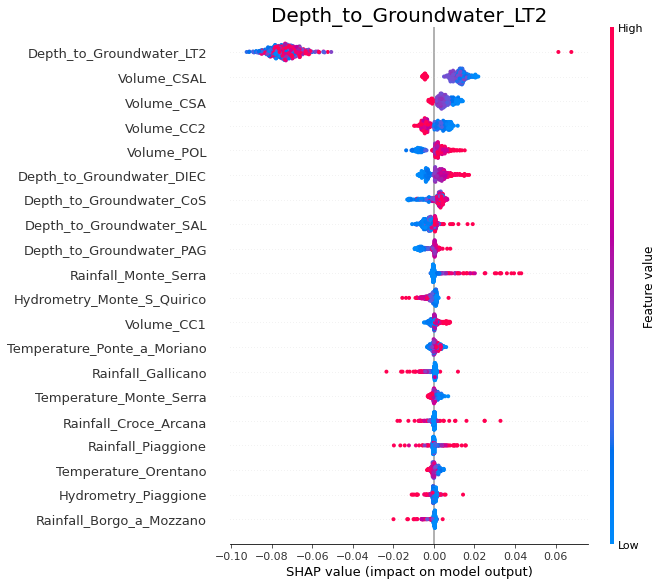

In [135]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [136]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [137]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([0.39147872, 0.47973647, 0.21106771])

In [138]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([0.33137571, 0.31476342, 0.18999404])

In [139]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([1.37654906, 1.96314825, 3.08307201])

In [140]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([0.53688523, 0.6715621 , 1.09247843])

# Aquifer Doganella

In [141]:
# Load the dataset
train = pd.read_csv('../input/acea-water-prediction/Aquifer_Doganella.csv', parse_dates=['Date'], dayfirst=True)
# Create a copy of the original data, since the 'train' dataframe will be modified
train_orig = train.copy()
train.head()

,Date,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,...,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
0,2004-01-01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.30,8.60
1,2004-01-02,0.2,0.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.70,6.25
2,2004-01-03,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.40,9.80
3,2004-01-04,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.35,5.95
4,2004-01-05,0.2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.60,5.85


In [142]:
train.tail()

,Date,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,...,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
6021,2020-06-26,0.0,0.0,-50.32,-100.35,-100.880,-101.49,-104.31,-97.94,-96.59,...,1516.104,3883.932,2526.516,3867.876,7949.304,2684.412,3911.832,3450.132,21.05,23.39
6022,2020-06-27,0.0,0.0,-50.32,-100.56,-100.840,-101.59,-104.30,-97.96,-96.44,...,1491.408,3884.724,2871.864,3867.300,7590.564,2681.280,3899.772,3449.088,22.18,24.44
6023,2020-06-28,0.0,0.0,-50.32,-100.56,-100.920,-101.59,-104.30,-98.46,-96.44,...,1485.756,3885.228,2858.400,3869.352,7944.660,2962.980,3901.032,3449.808,23.06,25.43
6024,2020-06-29,0.0,0.0,-50.32,-100.56,-101.190,-101.59,-104.30,-98.46,-96.10,...,1479.636,3888.684,2499.444,3873.096,7947.684,2653.884,3904.776,3129.336,22.03,24.22
6025,2020-06-30,0.0,0.0,-50.78,-100.56,-101.235,-101.59,-104.30,-98.47,-96.10,...,1470.096,3875.328,2812.356,3870.864,7941.996,2964.168,3901.932,3448.440,21.90,23.97


In [143]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6026 entries, 0 to 6025
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          6026 non-null   datetime64[ns]
 1   Rainfall_Monteporzio          5399 non-null   float64       
 2   Rainfall_Velletri             5374 non-null   float64       
 3   Depth_to_Groundwater_Pozzo_1  2537 non-null   float64       
 4   Depth_to_Groundwater_Pozzo_2  2736 non-null   float64       
 5   Depth_to_Groundwater_Pozzo_3  2774 non-null   float64       
 6   Depth_to_Groundwater_Pozzo_4  2374 non-null   float64       
 7   Depth_to_Groundwater_Pozzo_5  2508 non-null   float64       
 8   Depth_to_Groundwater_Pozzo_6  2428 non-null   float64       
 9   Depth_to_Groundwater_Pozzo_7  2311 non-null   float64       
 10  Depth_to_Groundwater_Pozzo_8  2551 non-null   float64       
 11  Depth_to_Groundwater_Pozzo_9  

In [144]:
targets = ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',\
          'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
          'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
          'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
          'Depth_to_Groundwater_Pozzo_9']

In [145]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

In [146]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [147]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

vol_df = train.filter(regex=("Volume.*"))
vols = vol_df.columns.tolist()
vol_df.insert(0, column = 'Date', value = train['Date'])

temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

depth_df = train.filter(regex=("Depth_to_Groundwater.*"))
depths = depth_df.columns.tolist()
depth_df.insert(0, column = 'Date', value = train['Date'])

hydro_df = train.filter(regex=("Hydrometry.*"))
hydros = hydro_df.columns.tolist()
hydro_df.insert(0, column = 'Date', value = train['Date'])

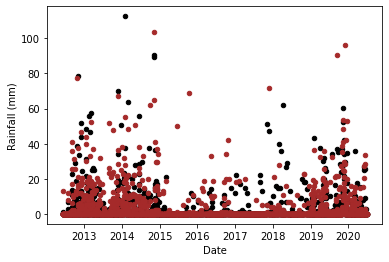

In [148]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

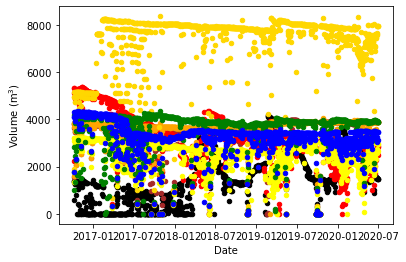

In [149]:
if len(vols)>0:
    i = 0
    while i<len(vols):
        if i == 0:
            ax1 = vol_df.plot.scatter(x = 'Date', y = f'{vols[i]}', color=colours[i])
        else:
            axes = vol_df.plot.scatter(x = 'Date', y = f'{vols[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Volume (m$^3$)')
        i += 1

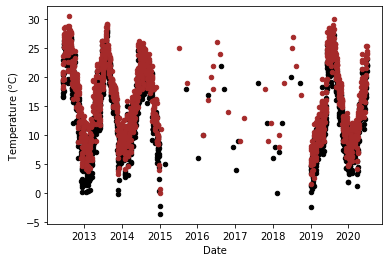

In [150]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

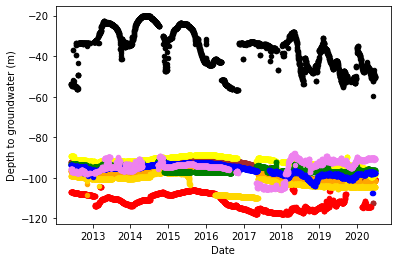

In [151]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

In [152]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [153]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [154]:
if len(vols)>0:
    i = 0
    while i<len(vols):
        train[f'{vols[i]}'] = train[f'{vols[i]}'].fillna(0)
        i += 1

In [155]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column   


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


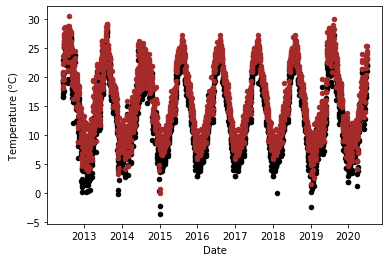

In [156]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [157]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        train[f'{hydros[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in hydros are errors, so replace them with Nans
    hydro_df2 = train.filter(regex=("Hydrometry.*"))
    hydros = hydro_df2.columns.tolist()
    hydro_df2.insert(0, column = 'Date', value = train['Date'])

In [158]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        X = pd.DataFrame(hydro_df2.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{hydros[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{hydros[i]}'].to_dict())
        X.loc[X[f'{hydros[i]}'].isnull() == False, 'same_day'] = X[f'{hydros[i]}']
        X.loc[X[f'{hydros[i]}'].isnull() == True, f'{hydros[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{hydros[i]}'].isnull() == False, f'{hydros[i]}' + '_new'] = X[f'{hydros[i]}']
    
        train[f'{hydros[i]}'].update(X[f'{hydros[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [159]:
imputer = MissForest()
train_copy = train_orig.copy()
if len(depths)>0:
    i = 0
    while i<len(depths):
        train_copy[f'{depths[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in depths are errors, so replace them with Nans
    train_copy = train_copy.drop(['Date'], axis=1)
    col_list = list(train_copy)
    imputs = imputer.fit_transform(train_copy)
    imputs = pd.DataFrame(data=imputs, columns=col_list)
    imputs['Date']= train_orig['Date']

Iteration: 0
Iteration: 1
Iteration: 2


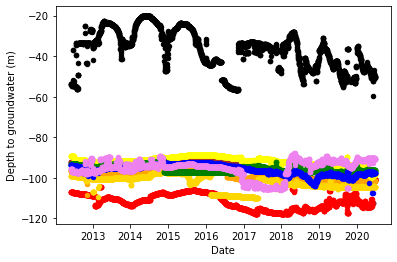

In [160]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        X = pd.DataFrame(depth_df.iloc[:, np.r_[0,i+1]])
        X.loc[X[f'{depths[i]}'].isnull() == True, f'{depths[i]}' + '_new'] =\
        X['Date'].map(imputs.set_index('Date')[f'{depths[i]}'].to_dict())
        X.loc[X[f'{depths[i]}'].isnull() == False, f'{depths[i]}' + '_new'] = X[f'{depths[i]}']
        train[f'{depths[i]}'] = X[f'{depths[i]}' + '_new']
        i += 1
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

In [161]:
days_ahead = 7

In [162]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs

In [163]:
train_rf = train.copy()

In [164]:
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(vols)>0:
    for v in vols:
        train_rf[v + '_roll_030'] = train_rf[v].rolling(30).mean().astype('float32')
        train_rf[v + '_roll_060'] = train_rf[v].rolling(60).mean().astype('float32')
        train_rf[v + '_roll_090'] = train_rf[v].rolling(90).mean().astype('float32')
        train_rf[v + '_roll_120'] = train_rf[v].rolling(120).mean().astype('float32')
        train_rf[v + '_roll_150'] = train_rf[v].rolling(150).mean().astype('float32')
        train_rf[v + '_roll_180'] = train_rf[v].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(hydros)>0:
    for h in hydros:
        train_rf[h + '_week_lag'] = train_rf[h].shift(7).astype('float32')
        train_rf[h + '_month_lag'] = train_rf[h].shift(30).astype('float32')
        train_rf[h + '_bimonth_lag'] = train_rf[h].shift(60).astype('float32')
        train_rf[h + '_quarter_lag'] = train_rf[h].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')

In [165]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [166]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [167]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

RandomForestRegressor(max_depth=30, random_state=2)

In [168]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [169]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

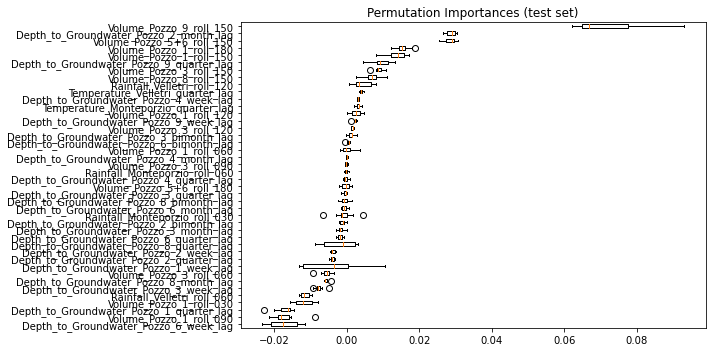

In [170]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [171]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([7.06296561, 1.62011393, 2.91856821, 1.16765001, 0.91468118,
       1.82086592, 0.48611452, 0.99925679, 1.41560377])

In [172]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([7.97484137, 2.23449185, 4.18142006, 1.31525103, 1.04554055,
       2.78842172, 0.60970065, 1.46102351, 2.49093292])

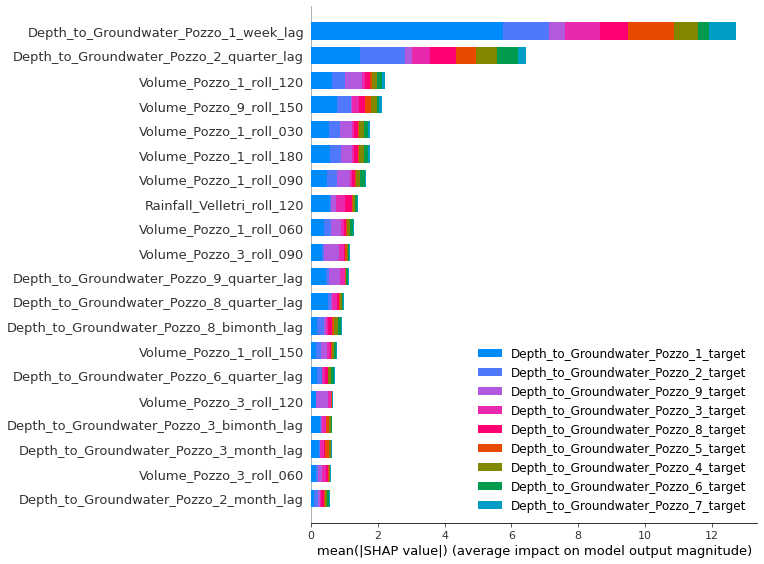

In [173]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [174]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

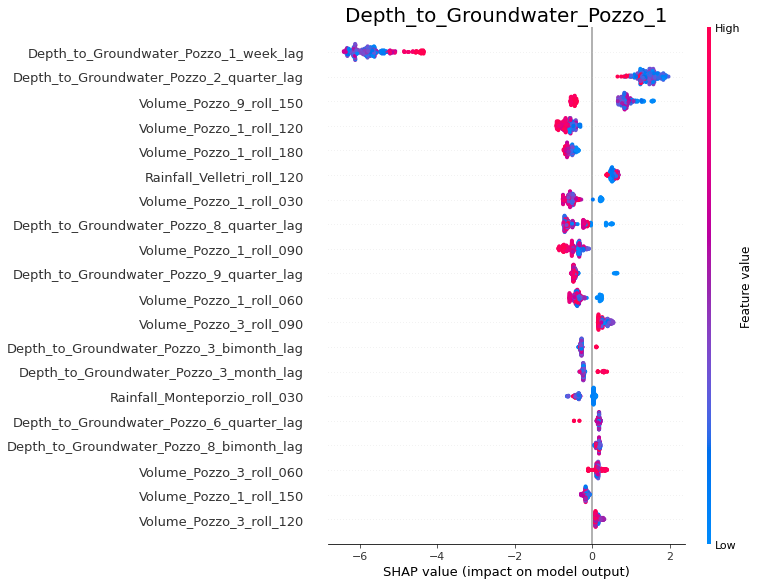

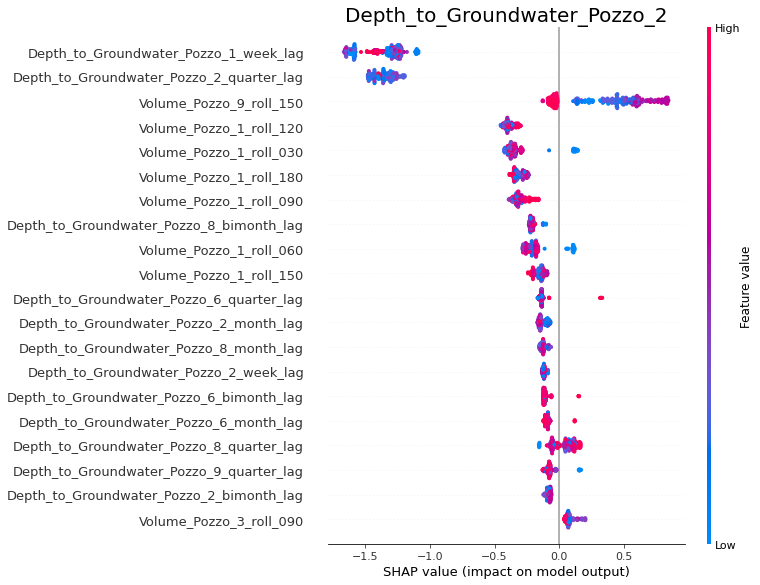

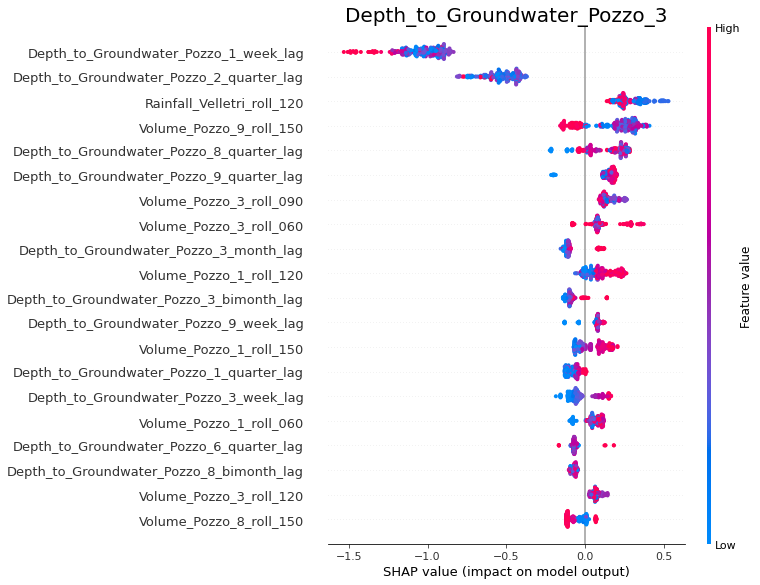

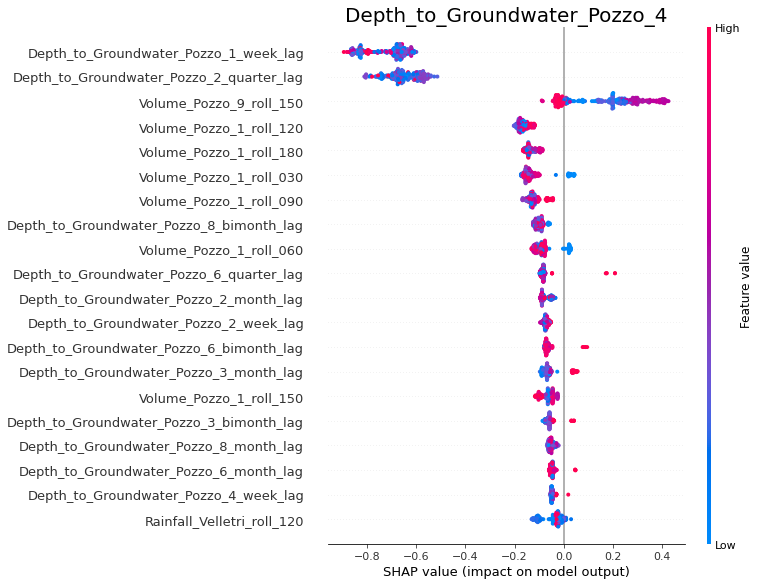

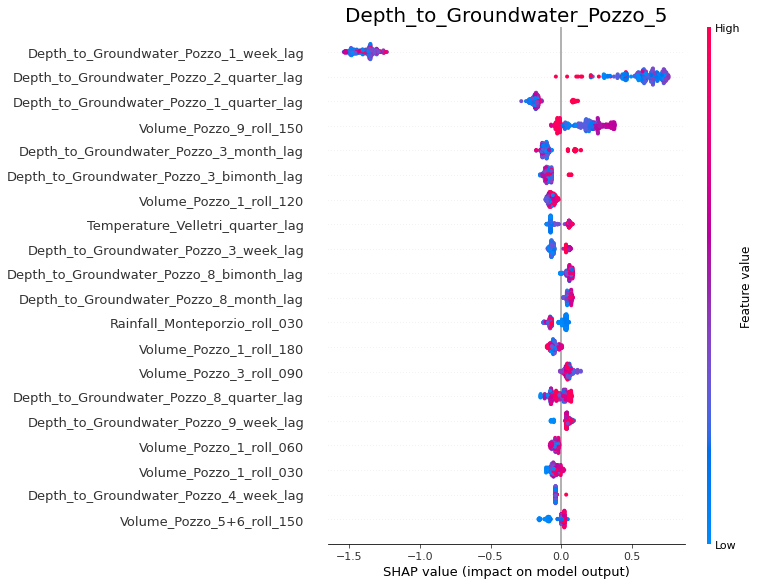

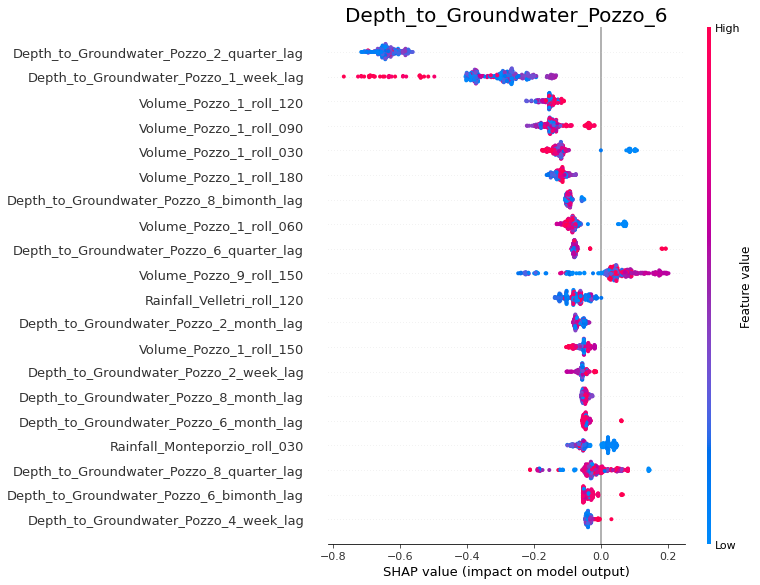

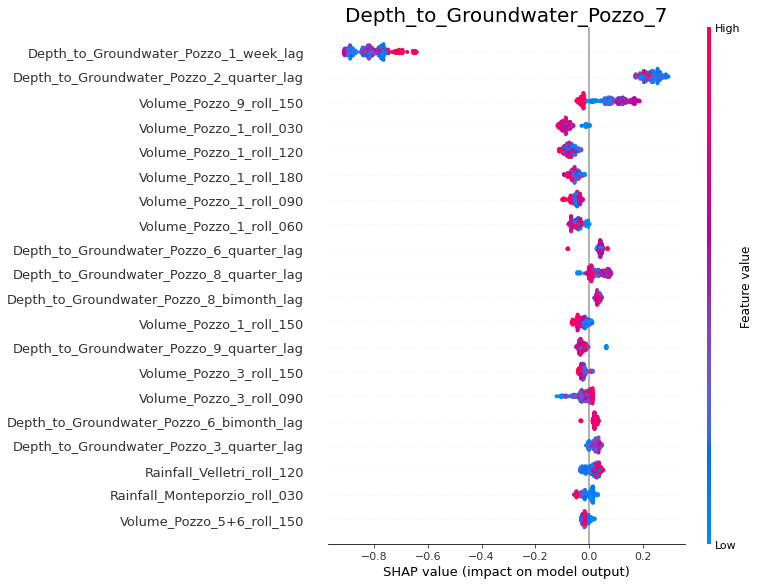

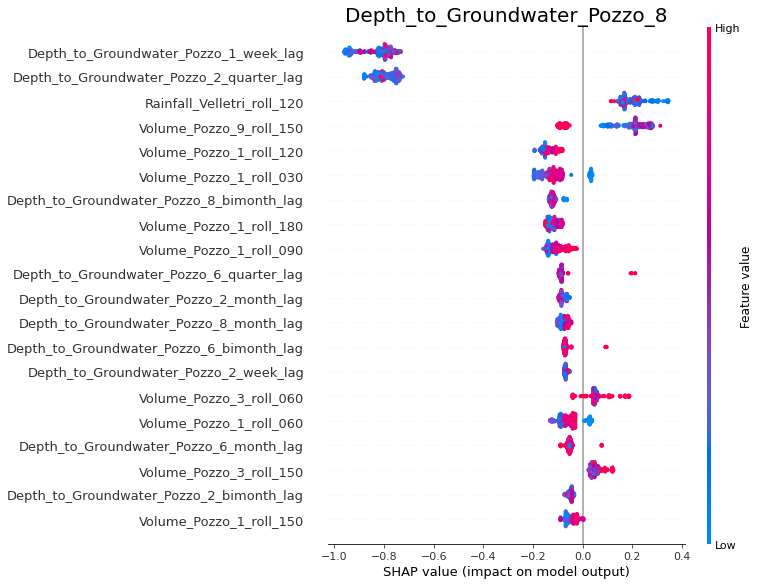

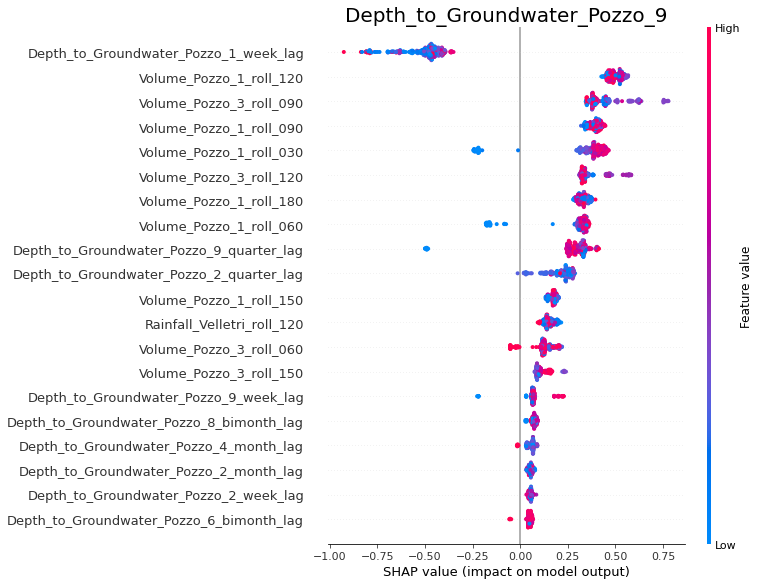

In [175]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [176]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

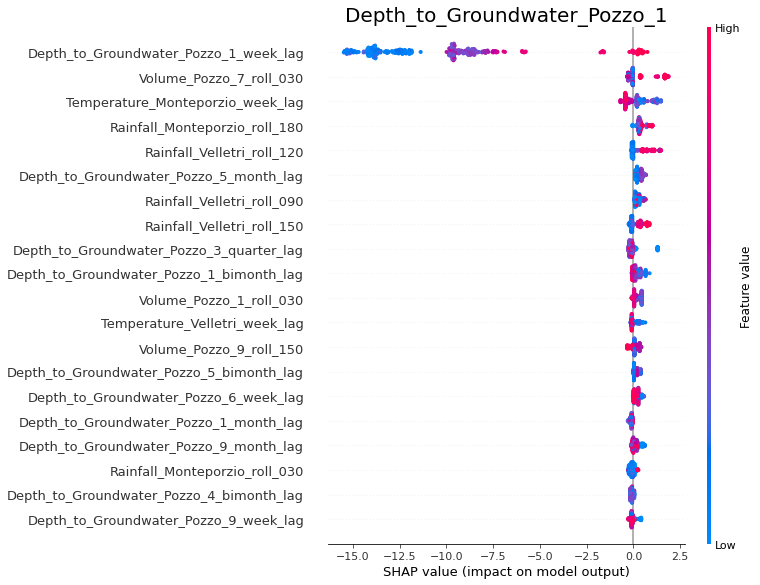

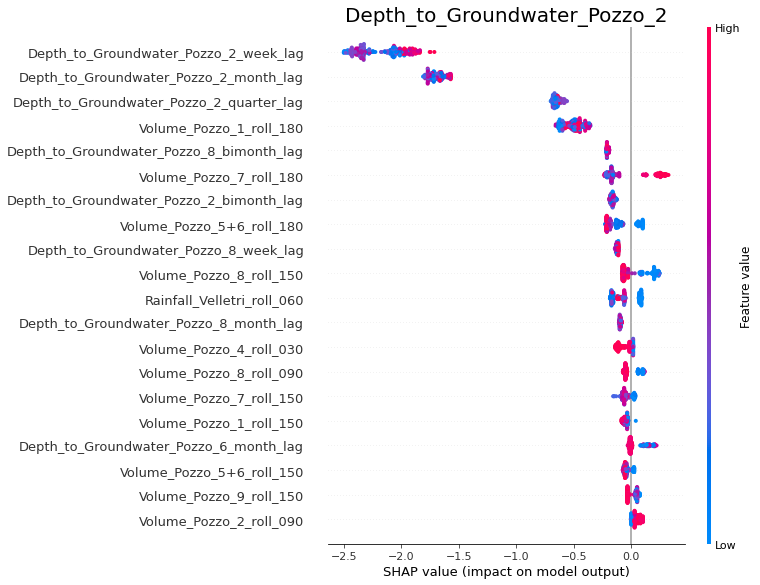

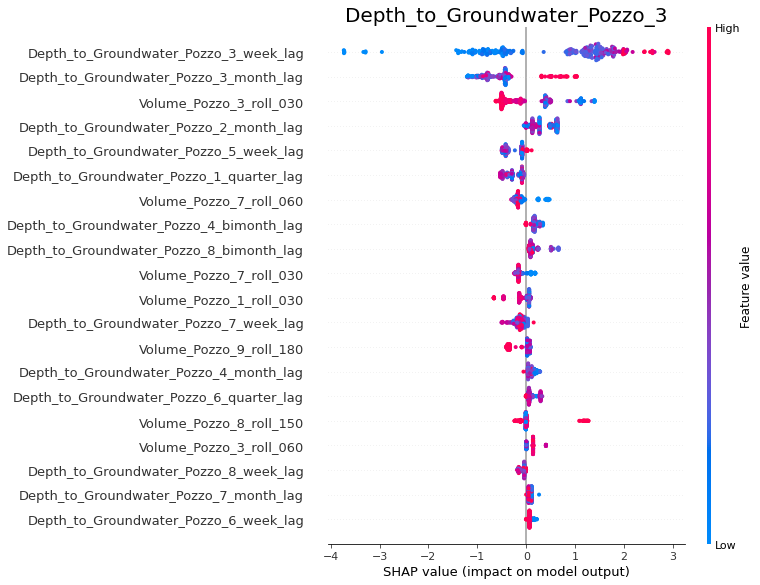

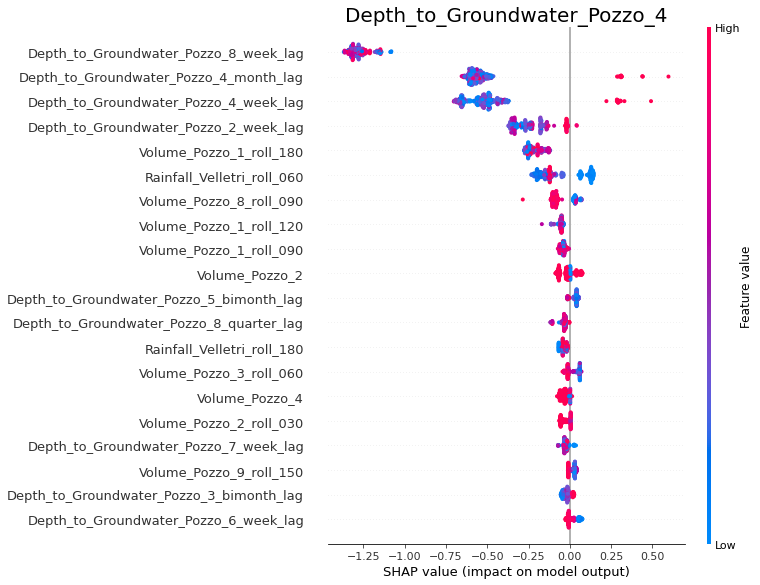

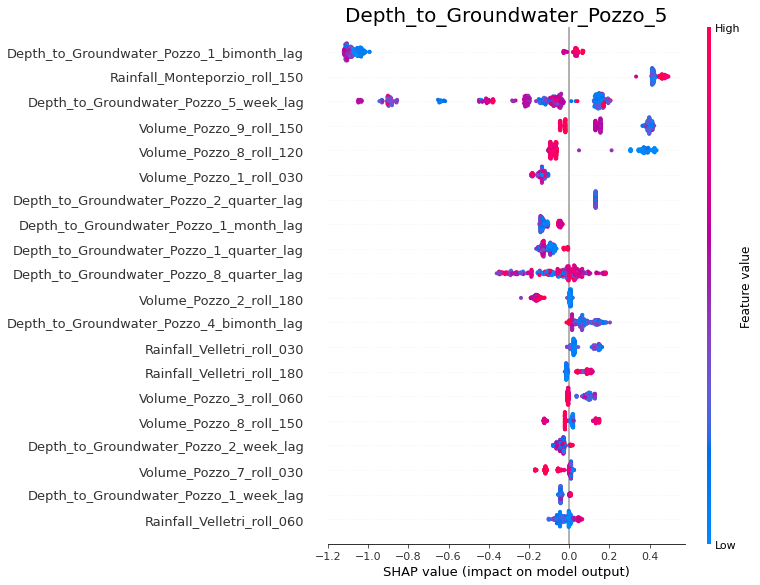

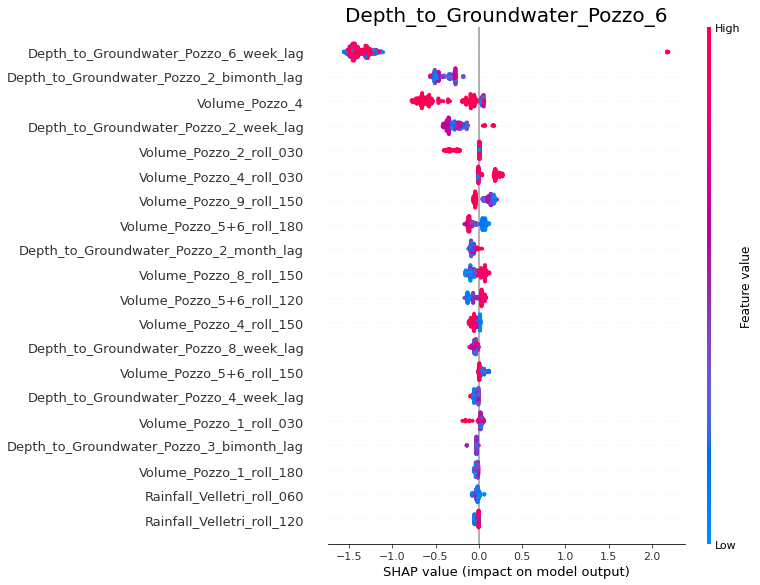

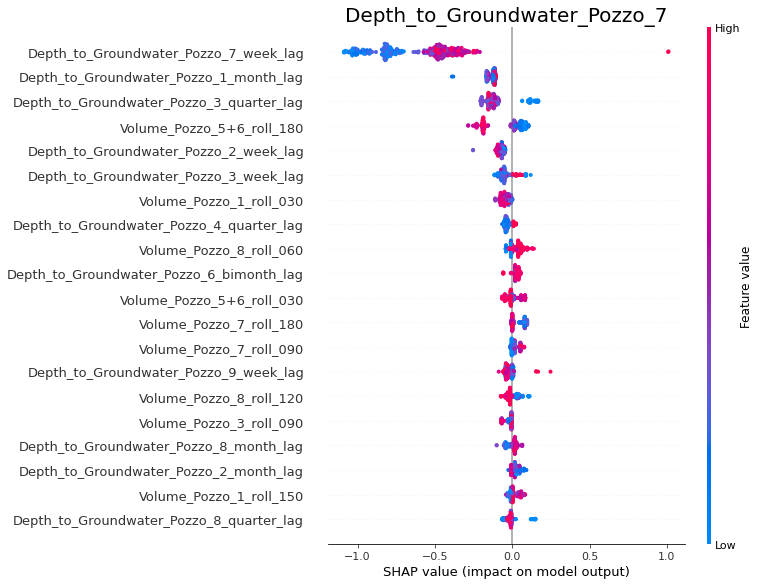

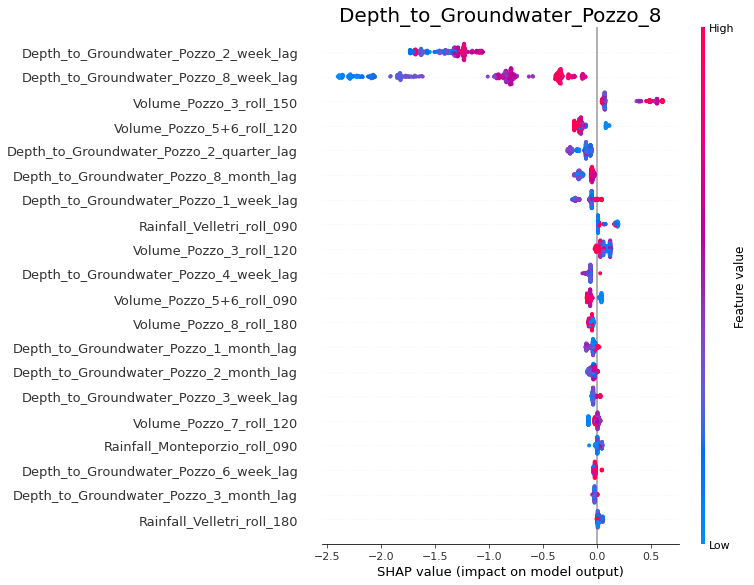

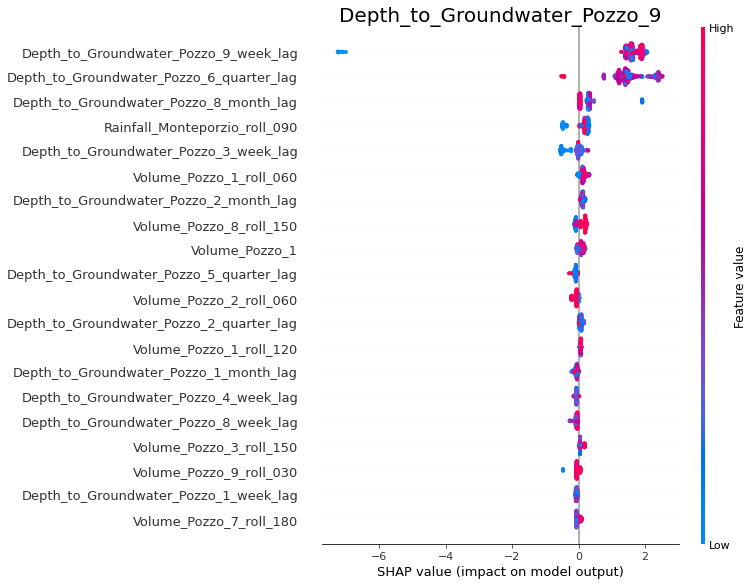

In [177]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [178]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([5.78507419, 1.07345472, 2.41044478, 0.83470464, 1.4845887 ,
       1.56796757, 0.38882749, 0.79798757, 1.5879203 ])

In [179]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([6.85733154, 1.84398862, 3.47563831, 1.12933815, 1.7670813 ,
       2.46588341, 0.52095251, 1.25966004, 2.60161616])

In [180]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [181]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(2576, 7, 21) (2576, 9)
(352, 7, 21) (352, 9)


In [182]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [183]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([3.43307184, 2.3332783 , 3.43045665, 1.85822964, 0.69595136,
       2.5363137 , 0.47902418, 1.67384582, 3.12398915])

In [184]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([4.46033583, 2.78063317, 4.51564775, 1.9619258 , 0.81561824,
       3.15658555, 0.62654541, 2.02381168, 3.57279916])

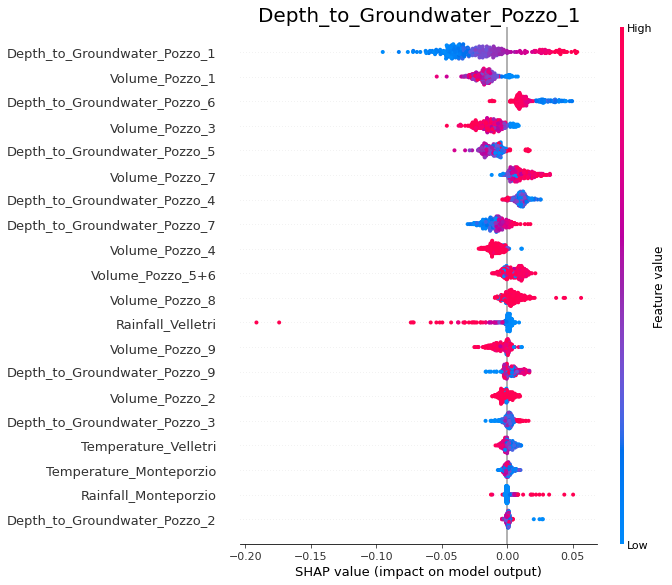

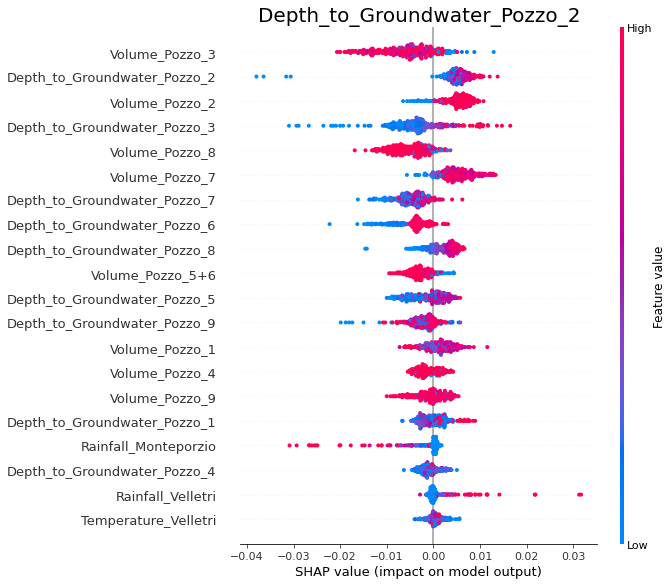

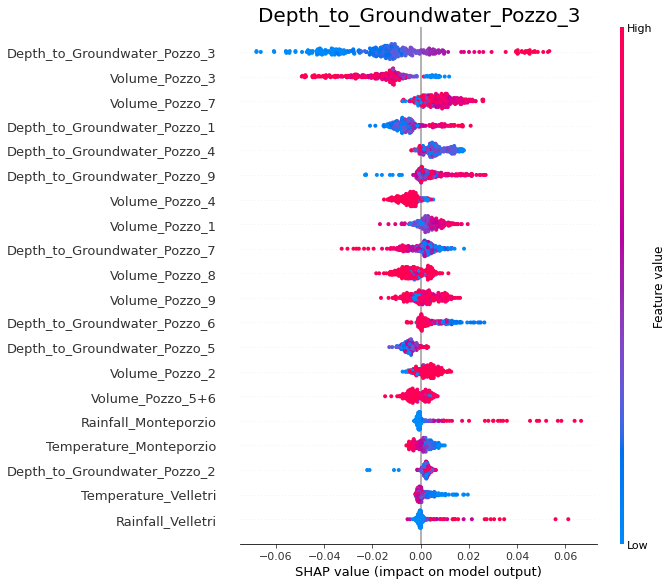

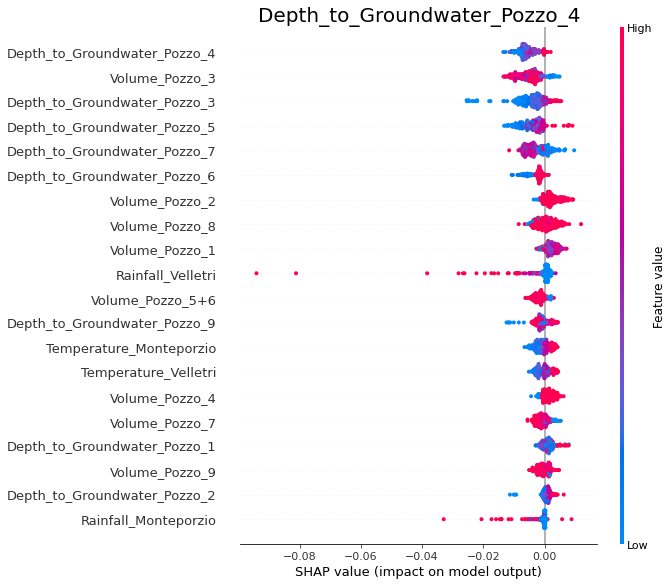

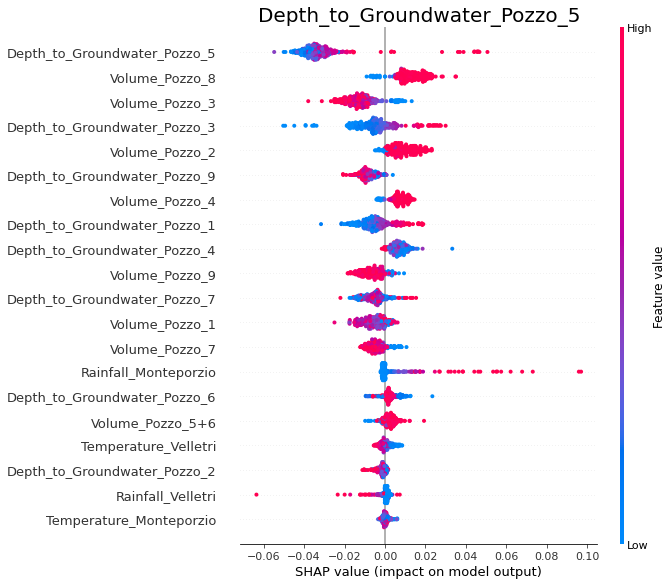

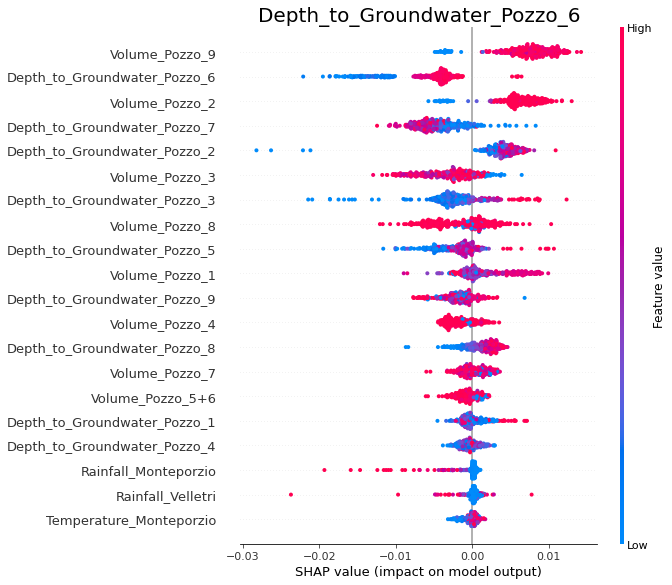

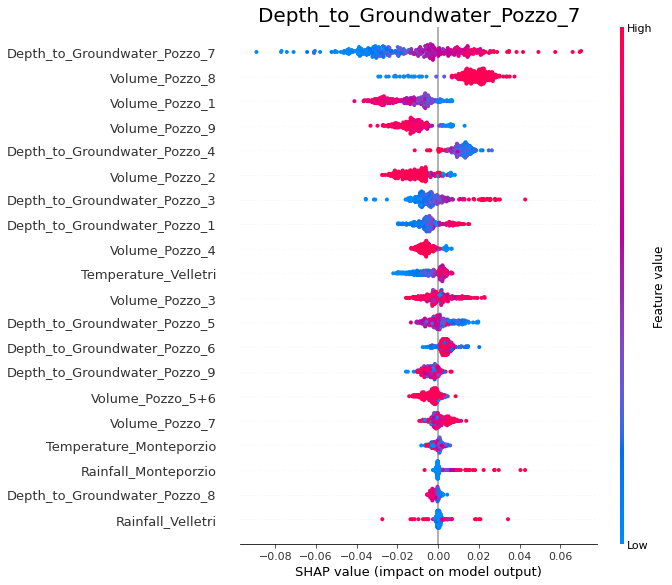

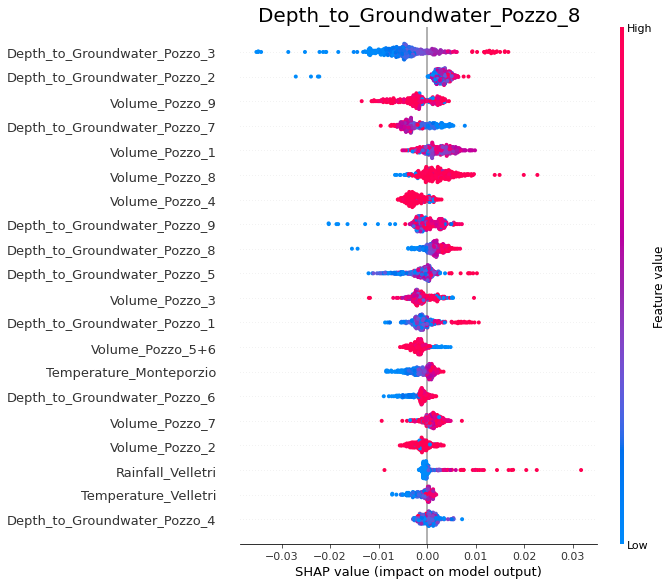

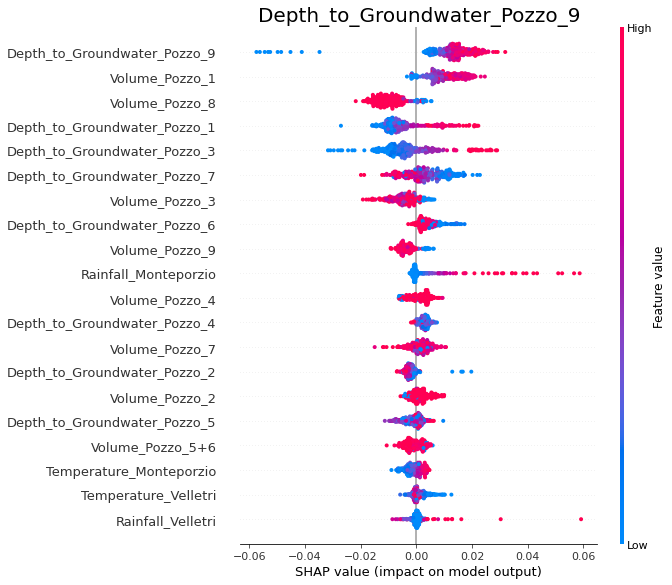

In [185]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [186]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [187]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([7.14874968, 1.64160024, 2.95932079, 1.18183484, 0.92866533,
       1.85010852, 0.49424687, 1.01487777, 1.4319288 ])

In [188]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([5.85825826, 1.08755209, 2.44714919, 0.84069578, 1.50463781,
       1.5919355 , 0.39456028, 0.80929882, 1.61030483])

In [189]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([3.43307184, 2.3332783 , 3.43045665, 1.85822964, 0.69595136,
       2.5363137 , 0.47902418, 1.67384582, 3.12398915])

In [190]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([4.93191562, 0.89259156, 2.69549513, 1.28026401, 1.03044748,
       1.8955721 , 0.38091065, 0.96588336, 1.63864132])

In [191]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='uniform_average')

2.072370314709596

In [192]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='uniform_average')

1.7938213936767273

In [193]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='uniform_average')

2.17379562478955

In [194]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='uniform_average')

1.7457468023061349

# Aquifer Luco

In [195]:
# Load the dataset
train = pd.read_csv('../input/acea-water-prediction/Aquifer_Luco.csv', parse_dates=['Date'], dayfirst=True)
# Create a copy of the original data, since the 'train' dataframe will be modified
train_orig = train.copy()
train.head()

,Date,Rainfall_Simignano,Rainfall_Siena_Poggio_al_Vento,Rainfall_Mensano,Rainfall_Montalcinello,Rainfall_Monticiano_la_Pineta,Rainfall_Sovicille,Rainfall_Ponte_Orgia,Rainfall_Scorgiano,Rainfall_Pentolina,...,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Temperature_Siena_Poggio_al_Vento,Temperature_Mensano,Temperature_Pentolina,Temperature_Monteroni_Arbia_Biena,Volume_Pozzo_1,Volume_Pozzo_3,Volume_Pozzo_4
0,2000-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,5.50,0.80,NaN,NaN,NaN
1,2000-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,6.20,3.25,NaN,NaN,NaN
2,2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,7.25,0.95,NaN,NaN,NaN
3,2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,7.00,4.20,NaN,NaN,NaN
4,2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,7.90,6.55,NaN,NaN,NaN


In [196]:
train.tail()

,Date,Rainfall_Simignano,Rainfall_Siena_Poggio_al_Vento,Rainfall_Mensano,Rainfall_Montalcinello,Rainfall_Monticiano_la_Pineta,Rainfall_Sovicille,Rainfall_Ponte_Orgia,Rainfall_Scorgiano,Rainfall_Pentolina,...,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Temperature_Siena_Poggio_al_Vento,Temperature_Mensano,Temperature_Pentolina,Temperature_Monteroni_Arbia_Biena,Volume_Pozzo_1,Volume_Pozzo_3,Volume_Pozzo_4
7482,2020-06-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-12.0,-10.7,-11.1,24.45,22.65,22.50,19.55,-125.506506,-147.012716,-49.136663
7483,2020-06-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-12.1,-10.8,-11.1,24.80,22.95,22.60,20.15,-125.506506,-147.012716,-49.136663
7484,2020-06-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-12.1,-10.7,-11.1,25.90,23.40,23.80,21.05,-125.506506,-147.012716,-49.136663
7485,2020-06-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-12.2,-10.8,-11.1,24.85,23.30,23.55,20.30,-125.506506,-147.012716,-49.136663
7486,2020-06-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-12.1,-10.8,-11.1,25.75,23.70,24.20,21.65,-125.506506,-147.012716,-49.136663


In [197]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7487 entries, 0 to 7486
Data columns (total 22 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Date                                 7487 non-null   datetime64[ns]
 1   Rainfall_Simignano                   6822 non-null   float64       
 2   Rainfall_Siena_Poggio_al_Vento       951 non-null    float64       
 3   Rainfall_Mensano                     1722 non-null   float64       
 4   Rainfall_Montalcinello               6525 non-null   float64       
 5   Rainfall_Monticiano_la_Pineta        2205 non-null   float64       
 6   Rainfall_Sovicille                   6657 non-null   float64       
 7   Rainfall_Ponte_Orgia                 1260 non-null   float64       
 8   Rainfall_Scorgiano                   3036 non-null   float64       
 9   Rainfall_Pentolina                   2116 non-null   float64       
 10  Rainfall_Mon

In [198]:
targets = ['Depth_to_Groundwater_Podere_Casetta']

In [199]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

In [200]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [201]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

vol_df = train.filter(regex=("Volume.*"))
vols = vol_df.columns.tolist()
vol_df.insert(0, column = 'Date', value = train['Date'])

temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

depth_df = train.filter(regex=("Depth_to_Groundwater.*"))
depths = depth_df.columns.tolist()
depth_df.insert(0, column = 'Date', value = train['Date'])

hydro_df = train.filter(regex=("Hydrometry.*"))
hydros = hydro_df.columns.tolist()
hydro_df.insert(0, column = 'Date', value = train['Date'])

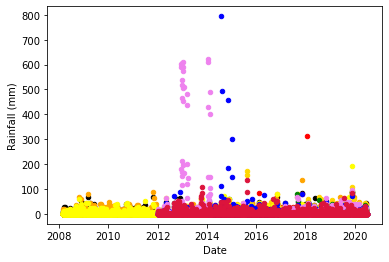

In [202]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

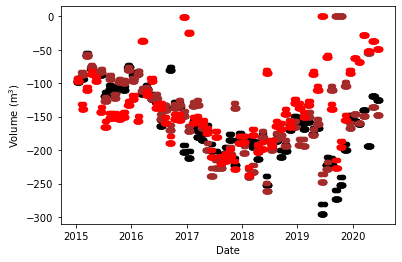

In [203]:
if len(vols)>0:
    i = 0
    while i<len(vols):
        if i == 0:
            ax1 = vol_df.plot.scatter(x = 'Date', y = f'{vols[i]}', color=colours[i])
        else:
            axes = vol_df.plot.scatter(x = 'Date', y = f'{vols[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Volume (m$^3$)')
        i += 1

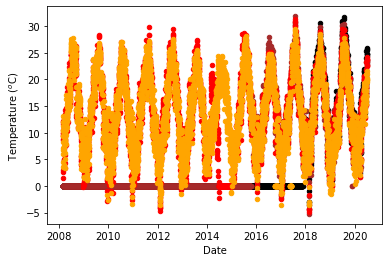

In [204]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

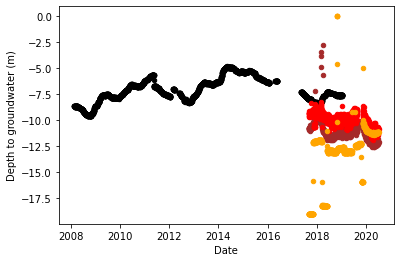

In [205]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

In [206]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [207]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [208]:
if len(vols)>0:
    i = 0
    while i<len(vols):
        train[f'{vols[i]}'] = train[f'{vols[i]}'].fillna(0)
        i += 1

In [209]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column   


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

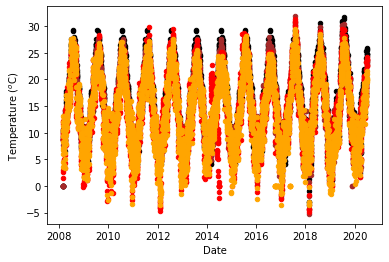

In [210]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [211]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        train[f'{hydros[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in hydros are errors, so replace them with Nans
    hydro_df2 = train.filter(regex=("Hydrometry.*"))
    hydros = hydro_df2.columns.tolist()
    hydro_df2.insert(0, column = 'Date', value = train['Date'])

In [212]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        X = pd.DataFrame(hydro_df2.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{hydros[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{hydros[i]}'].to_dict())
        X.loc[X[f'{hydros[i]}'].isnull() == False, 'same_day'] = X[f'{hydros[i]}']
        X.loc[X[f'{hydros[i]}'].isnull() == True, f'{hydros[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{hydros[i]}'].isnull() == False, f'{hydros[i]}' + '_new'] = X[f'{hydros[i]}']
    
        train[f'{hydros[i]}'].update(X[f'{hydros[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [213]:
imputer = MissForest()
train_copy = train_orig.copy()
if len(depths)>0:
    i = 0
    while i<len(depths):
        train_copy[f'{depths[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in depths are errors, so replace them with Nans
    train_copy = train_copy.drop(['Date'], axis=1)
    col_list = list(train_copy)
    imputs = imputer.fit_transform(train_copy)
    imputs = pd.DataFrame(data=imputs, columns=col_list)
    imputs['Date']= train_orig['Date']

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3


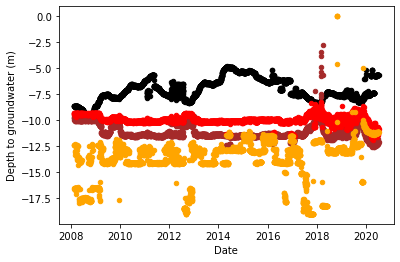

In [214]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        X = pd.DataFrame(depth_df.iloc[:, np.r_[0,i+1]])
        X.loc[X[f'{depths[i]}'].isnull() == True, f'{depths[i]}' + '_new'] =\
        X['Date'].map(imputs.set_index('Date')[f'{depths[i]}'].to_dict())
        X.loc[X[f'{depths[i]}'].isnull() == False, f'{depths[i]}' + '_new'] = X[f'{depths[i]}']
        train[f'{depths[i]}'] = X[f'{depths[i]}' + '_new']
        i += 1
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

In [215]:
days_ahead = 7

In [216]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()

In [217]:
train_rf = train.copy()

In [218]:
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(vols)>0:
    for v in vols:
        train_rf[v + '_roll_030'] = train_rf[v].rolling(30).mean().astype('float32')
        train_rf[v + '_roll_060'] = train_rf[v].rolling(60).mean().astype('float32')
        train_rf[v + '_roll_090'] = train_rf[v].rolling(90).mean().astype('float32')
        train_rf[v + '_roll_120'] = train_rf[v].rolling(120).mean().astype('float32')
        train_rf[v + '_roll_150'] = train_rf[v].rolling(150).mean().astype('float32')
        train_rf[v + '_roll_180'] = train_rf[v].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(hydros)>0:
    for h in hydros:
        train_rf[h + '_week_lag'] = train_rf[h].shift(7).astype('float32')
        train_rf[h + '_month_lag'] = train_rf[h].shift(30).astype('float32')
        train_rf[h + '_bimonth_lag'] = train_rf[h].shift(60).astype('float32')
        train_rf[h + '_quarter_lag'] = train_rf[h].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')

In [219]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [220]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [221]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestRegressor(max_depth=30, random_state=2)

In [222]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [223]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


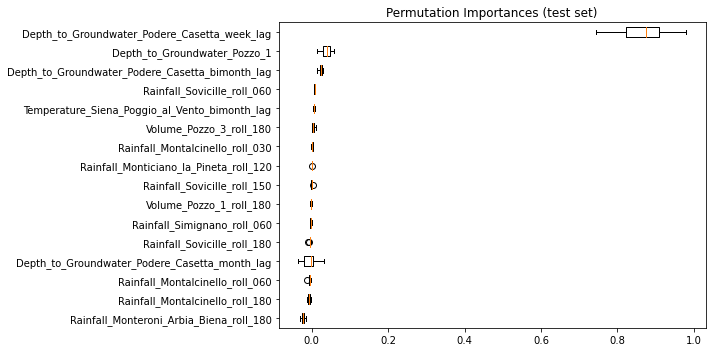

In [224]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [225]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([0.44951391])

In [226]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([0.66685762])

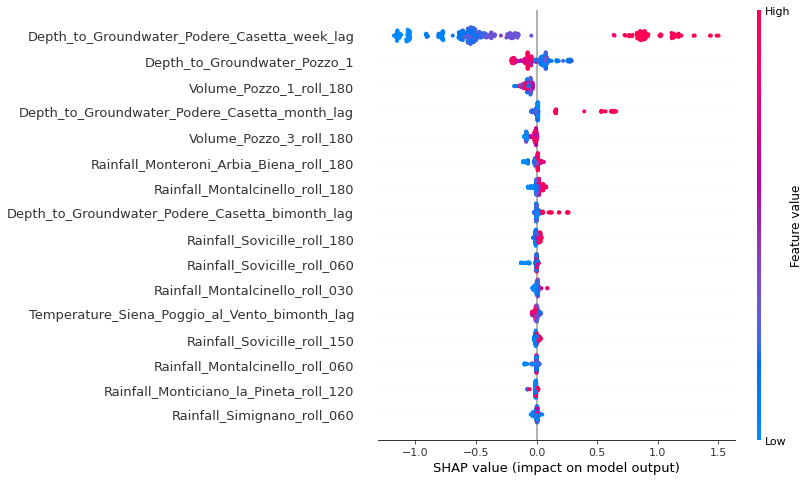

In [227]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [228]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

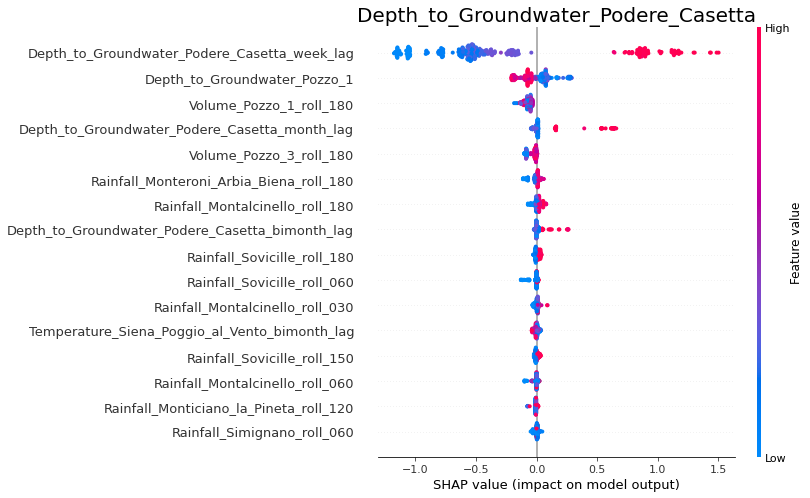

In [229]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [230]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

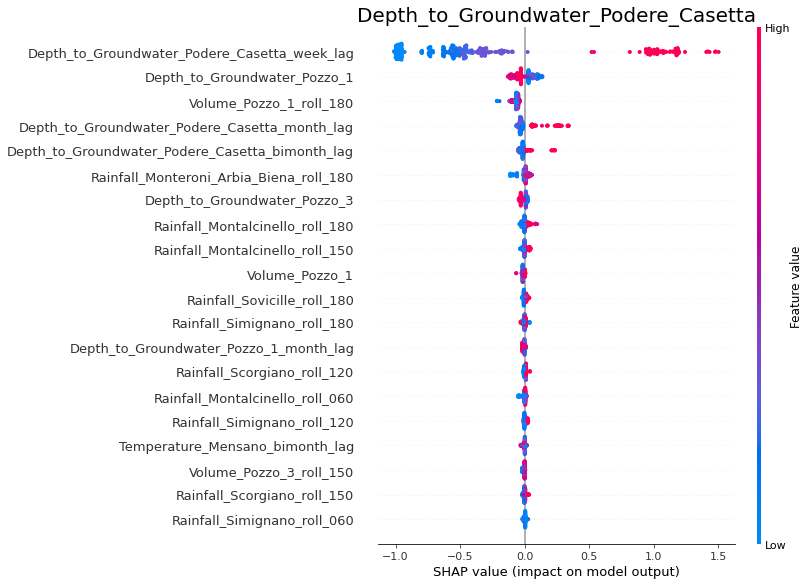

In [231]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [232]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([0.40608163])

In [233]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([0.62381346])

In [234]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [235]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(4134, 7, 21) (4134, 1)
(352, 7, 21) (352, 1)


In [236]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [237]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.40040688])

In [238]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([0.57381868])

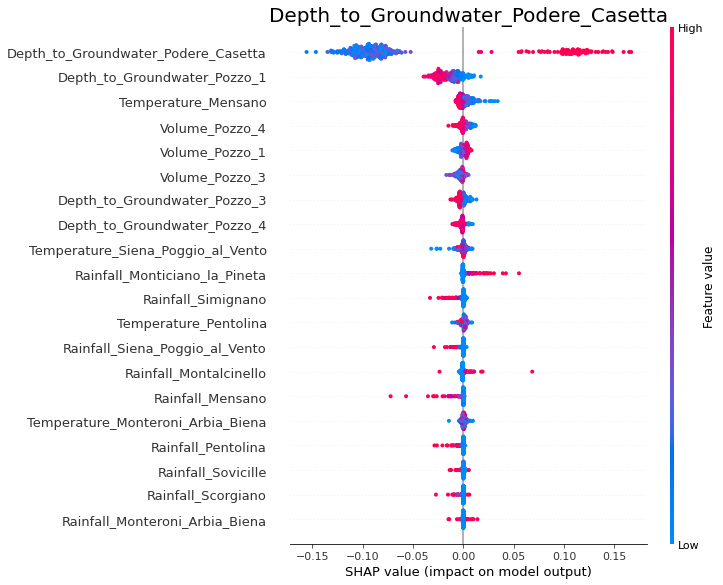

In [239]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [240]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [241]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([0.45599773])

In [242]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([0.41181693])

In [243]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.40040688])

In [244]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([0.39196036])

# Water spring Amiata

In [245]:
train=pd.read_csv('../input/acea-water-prediction/Water_Spring_Amiata.csv', parse_dates=['Date'], dayfirst=True)
train_orig = train.copy()
train.head()

,Date,Rainfall_Castel_del_Piano,Rainfall_Abbadia_S_Salvatore,Rainfall_S_Fiora,Rainfall_Laghetto_Verde,Rainfall_Vetta_Amiata,Depth_to_Groundwater_S_Fiora_8,Depth_to_Groundwater_S_Fiora_11bis,Depth_to_Groundwater_David_Lazzaretti,Temperature_Abbadia_S_Salvatore,Temperature_S_Fiora,Temperature_Laghetto_Verde,Flow_Rate_Bugnano,Flow_Rate_Arbure,Flow_Rate_Ermicciolo,Flow_Rate_Galleria_Alta
0,2000-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.15,NaN,NaN,NaN,NaN,NaN
1,2000-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.55,NaN,NaN,NaN,NaN,NaN
2,2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.70,NaN,NaN,NaN,NaN,NaN
3,2000-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.00,NaN,NaN,NaN,NaN,NaN
4,2000-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.60,NaN,NaN,NaN,NaN,NaN


In [246]:
train.tail()

,Date,Rainfall_Castel_del_Piano,Rainfall_Abbadia_S_Salvatore,Rainfall_S_Fiora,Rainfall_Laghetto_Verde,Rainfall_Vetta_Amiata,Depth_to_Groundwater_S_Fiora_8,Depth_to_Groundwater_S_Fiora_11bis,Depth_to_Groundwater_David_Lazzaretti,Temperature_Abbadia_S_Salvatore,Temperature_S_Fiora,Temperature_Laghetto_Verde,Flow_Rate_Bugnano,Flow_Rate_Arbure,Flow_Rate_Ermicciolo,Flow_Rate_Galleria_Alta
7482,2020-06-26,0.0,0.0,0.0,0.0,0.0,-38.38,-51.89,-303.27,20.70,18.30,19.20,-0.359942,-2.925253,-5.75661,-21.358856
7483,2020-06-27,0.0,0.0,0.0,0.0,0.0,-38.38,-51.89,-303.27,20.50,17.95,18.85,-0.359942,-2.925253,-5.75661,-21.358856
7484,2020-06-28,0.0,0.0,0.0,0.0,0.0,-38.38,-51.89,-303.27,22.10,19.90,20.45,-0.341945,-2.778991,-5.46878,-20.290913
7485,2020-06-29,0.0,0.0,0.0,0.0,0.0,-38.37,-51.89,-303.28,22.45,20.15,20.20,-0.359942,-2.925253,-5.75661,-21.358856
7486,2020-06-30,0.0,0.0,0.0,0.0,0.0,-38.37,-51.89,-303.27,22.00,20.35,21.10,-0.359942,-2.925253,-5.75661,-21.358856


In [247]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7487 entries, 0 to 7486
Data columns (total 16 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Date                                   7487 non-null   datetime64[ns]
 1   Rainfall_Castel_del_Piano              6291 non-null   float64       
 2   Rainfall_Abbadia_S_Salvatore           3586 non-null   float64       
 3   Rainfall_S_Fiora                       2633 non-null   float64       
 4   Rainfall_Laghetto_Verde                2865 non-null   float64       
 5   Rainfall_Vetta_Amiata                  2212 non-null   float64       
 6   Depth_to_Groundwater_S_Fiora_8         3569 non-null   float64       
 7   Depth_to_Groundwater_S_Fiora_11bis     3594 non-null   float64       
 8   Depth_to_Groundwater_David_Lazzaretti  3242 non-null   float64       
 9   Temperature_Abbadia_S_Salvatore        3583 non-null   float64 

In [248]:
targets = ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure',\
 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']

In [249]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

In [250]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [251]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

In [252]:
depth_df = train.filter(regex=("Depth_to_Groundwater.*"))
depths = depth_df.columns.tolist()
depth_df.insert(0, column = 'Date', value = train['Date'])

In [253]:
temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

In [254]:
flow_df = train.filter(regex=("Flow_Rate.*"))
flows = flow_df.columns.tolist()
flow_df.insert(0, column = 'Date', value = train['Date'])

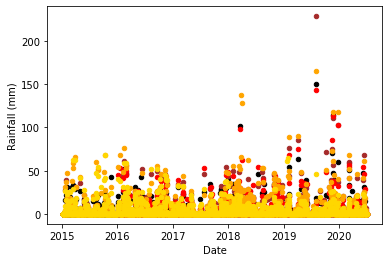

In [255]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

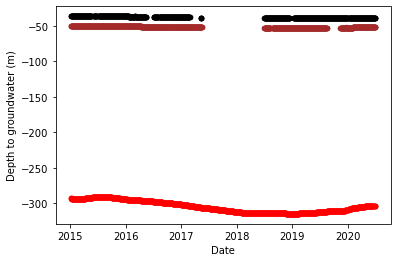

In [256]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

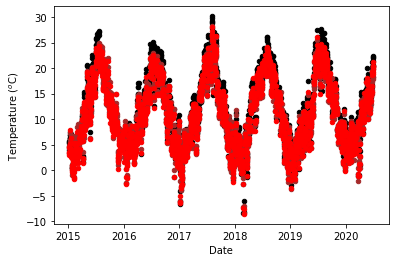

In [257]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

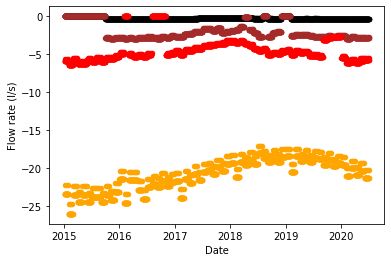

In [258]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        if i == 0:
            ax1 = flow_df.plot.scatter(x = 'Date', y = f'{flows[i]}', color=colours[i])
        else:
            axes = flow_df.plot.scatter(x = 'Date', y = f'{flows[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Flow rate (l/s)')
        i += 1

In [259]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [260]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        train[f'{flows[i]}'].replace(0, np.nan, inplace=True)
        i += 1
        
# 0s in flows are errors, so replace them with Nans

In [261]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        train[f'{flows[i]}'] = train[f'{flows[i]}']\
        .fillna(train[f'{flows[i]}'].rolling(100, min_periods=1).mean())
        i += 1

In [262]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column    


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


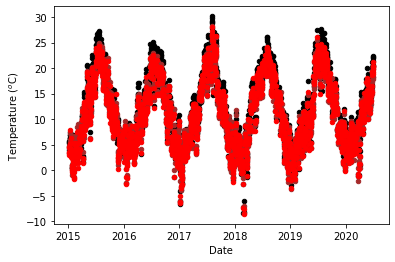

In [263]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [264]:
imputer = MissForest()
train_copy = train_orig.copy()
if len(depths)>0:
    i = 0
    while i<len(depths):
        train_copy[f'{depths[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in depths are errors, so replace them with Nans
    train_copy = train_copy.drop(['Date'], axis=1)
    col_list = list(train_copy)
    imputs = imputer.fit_transform(train_copy)
    imputs = pd.DataFrame(data=imputs, columns=col_list)
    imputs['Date']= train_orig['Date']

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5


In [265]:
days_ahead = 7

In [266]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs

In [267]:
train_rf = train.copy()
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')
if len(flows)>0:
    for f in flows:
        train_rf[f + '_week_lag'] = train_rf[f].shift(7).astype('float32')
        train_rf[f + '_month_lag'] = train_rf[f].shift(30).astype('float32')
        train_rf[f + '_bimonth_lag'] = train_rf[f].shift(60).astype('float32')
        train_rf[f + '_quarter_lag'] = train_rf[f].shift(90).astype('float32')

In [268]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [269]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [270]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

RandomForestRegressor(max_depth=30, random_state=2)

In [271]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [272]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

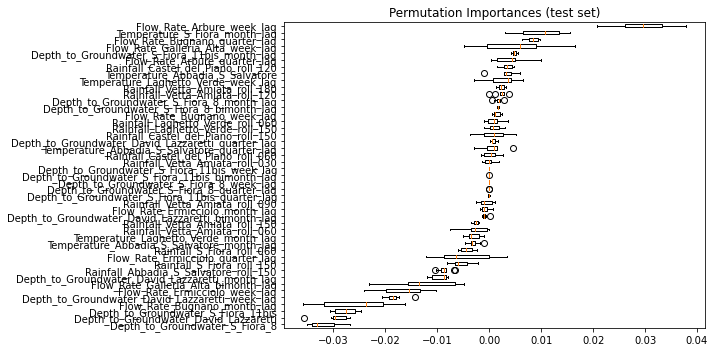

In [273]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [274]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([0.03756324, 0.25443484, 1.12186816, 0.75123461])

In [275]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([0.0413214 , 0.28940193, 1.27270672, 0.90706751])

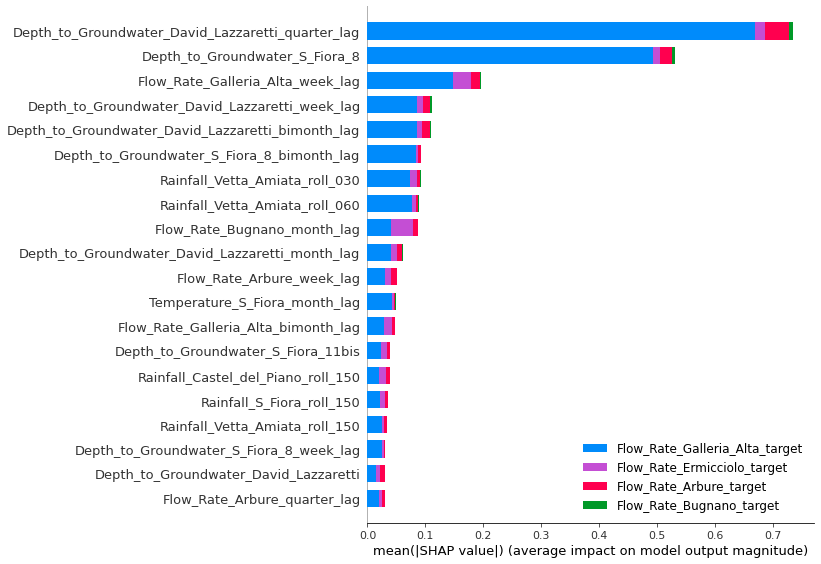

In [276]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [277]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

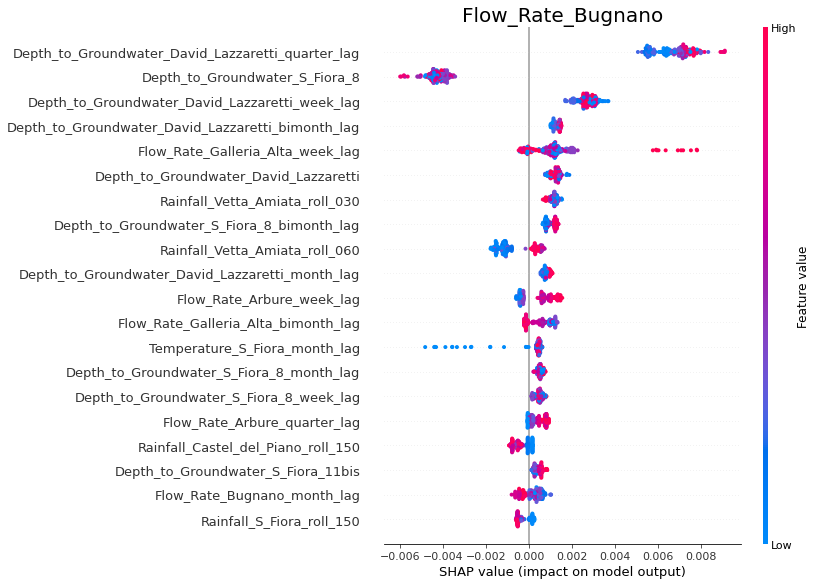

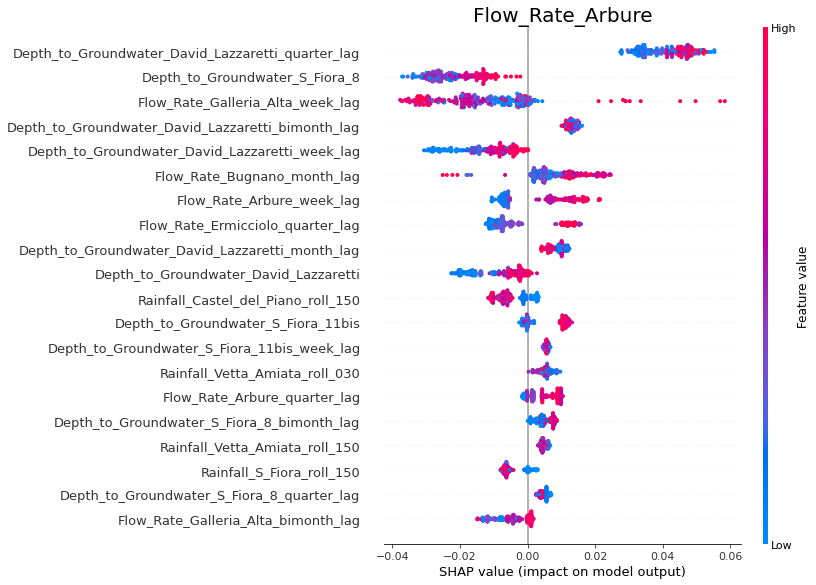

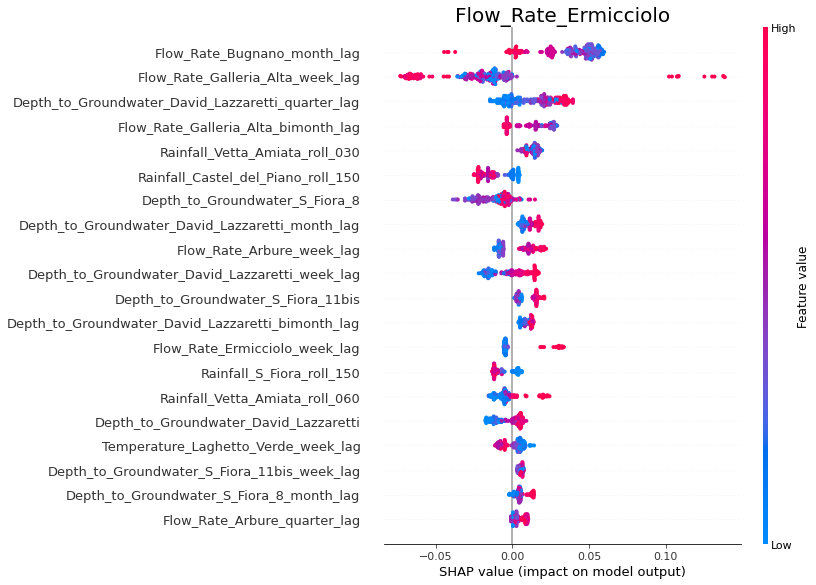

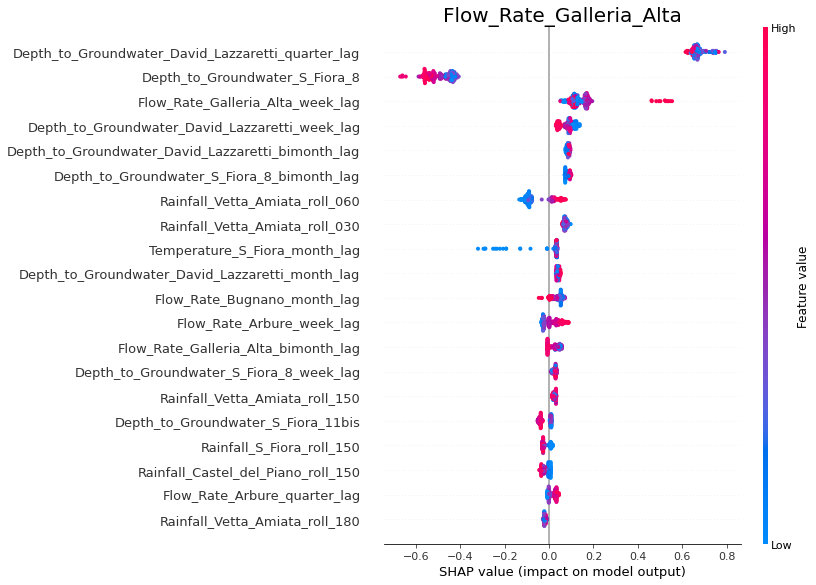

In [278]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [279]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

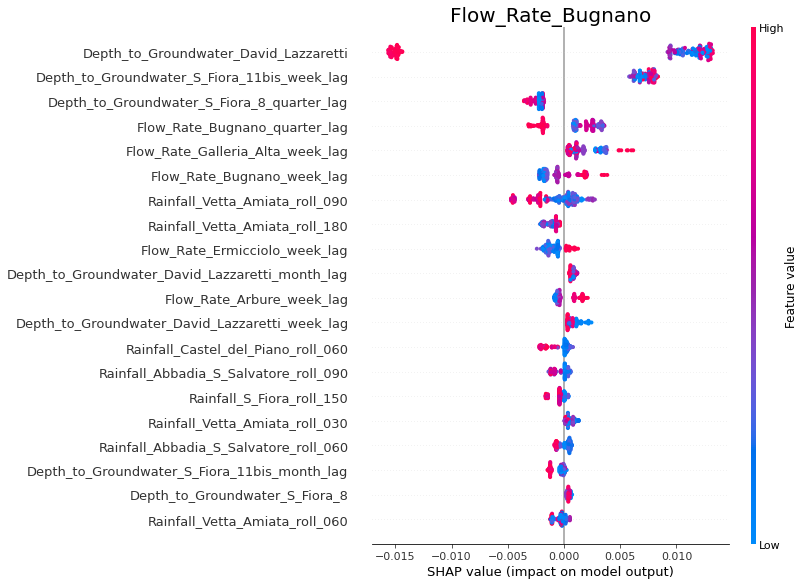

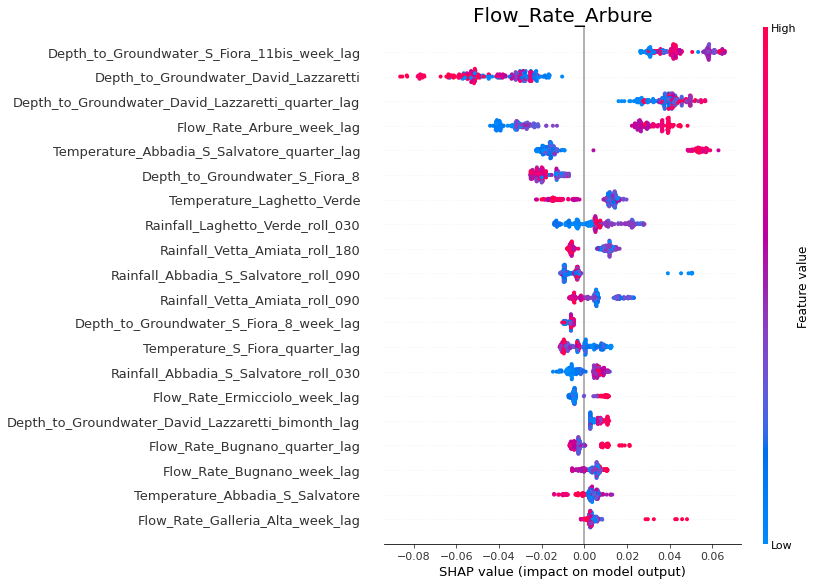

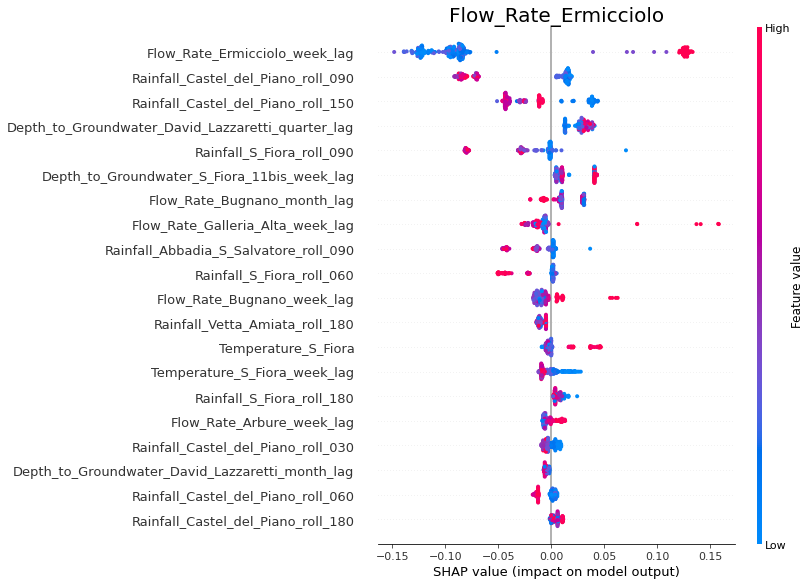

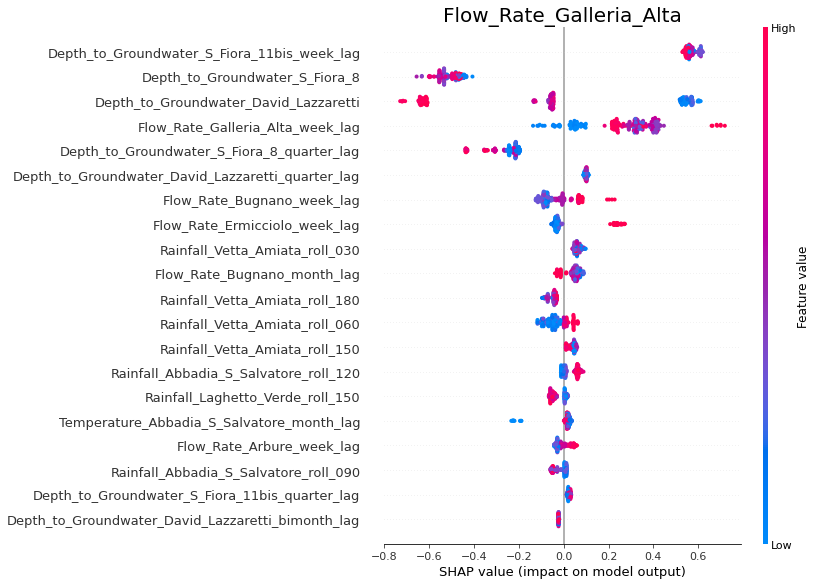

In [280]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [281]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([0.03121566, 0.24733113, 0.99869366, 0.53801921])

In [282]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([0.03828443, 0.27113279, 1.20042447, 0.63869696])

In [283]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [284]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(780, 7, 15) (780, 4)
(247, 7, 15) (247, 4)


In [285]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [286]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.01237833, 0.06159427, 0.58813525, 0.31277939])

In [287]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([0.01522566, 0.08007715, 0.76281188, 0.43017155])

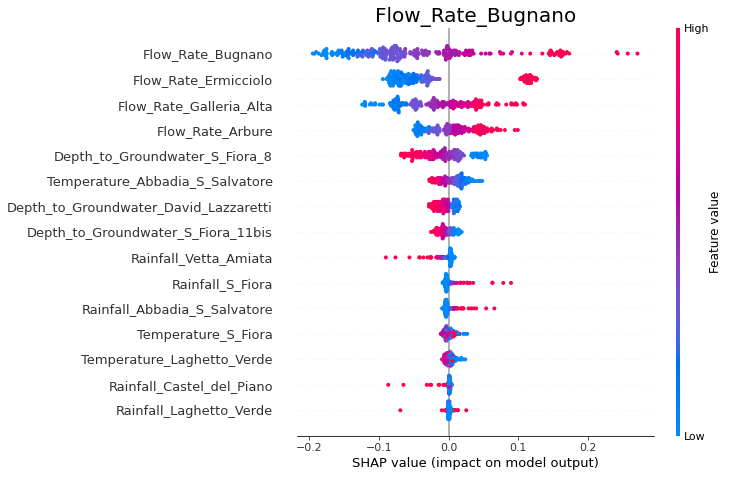

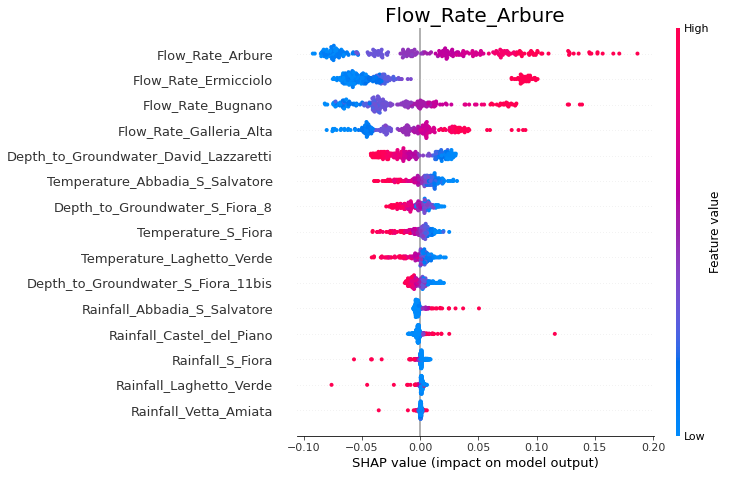

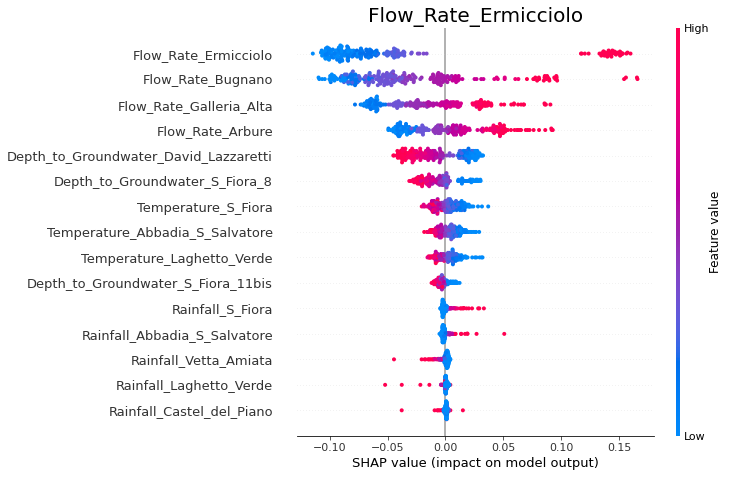

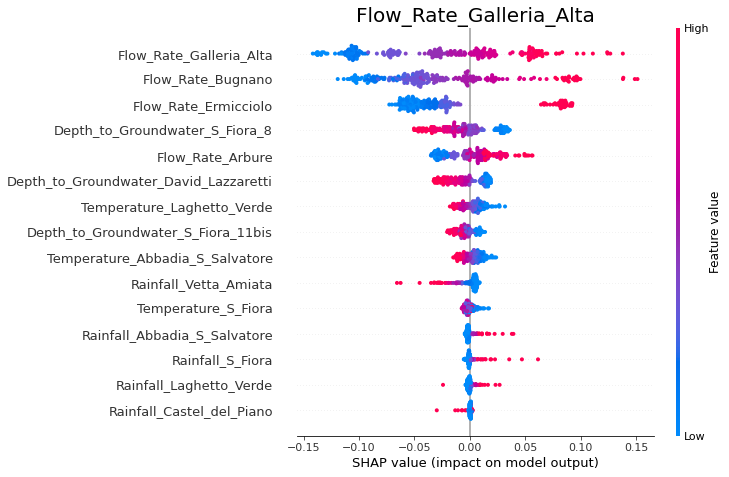

In [288]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [289]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [290]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([0.03816591, 0.25654675, 1.14464096, 0.75110114])

In [291]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([0.03193906, 0.25154378, 1.01772592, 0.53857439])

In [292]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.01237833, 0.06159427, 0.58813525, 0.31277939])

In [293]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([0.02605241, 0.1673263 , 0.90640898, 0.44198754])

# Water spring Lupa

In [294]:
train=pd.read_csv('../input/acea-water-prediction/Water_Spring_Lupa.csv', parse_dates=['Date'], dayfirst=True)
train_orig = train.copy()
train.head()

,Date,Rainfall_Terni,Flow_Rate_Lupa
0,2009-01-01,2.797,NaN
1,2009-01-02,2.797,NaN
2,2009-01-03,2.797,NaN
3,2009-01-04,2.797,NaN
4,2009-01-05,2.797,NaN


In [295]:
train.tail()

,Date,Rainfall_Terni,Flow_Rate_Lupa
4194,2020-06-26,0.0,-73.93
4195,2020-06-27,0.0,-73.60
4196,2020-06-28,0.0,-73.14
4197,2020-06-29,0.0,-72.88
4198,2020-06-30,0.0,-72.55


In [296]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4199 entries, 0 to 4198
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            4199 non-null   datetime64[ns]
 1   Rainfall_Terni  4199 non-null   float64       
 2   Flow_Rate_Lupa  3817 non-null   float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 98.5 KB


In [297]:
targets = ['Flow_Rate_Lupa']

In [298]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

# Removing Feb 29s, otherwise there are length issues later.

In [299]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [300]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

In [301]:
depth_df = train.filter(regex=("Depth_to_Groundwater.*"))
depths = depth_df.columns.tolist()
depth_df.insert(0, column = 'Date', value = train['Date'])

In [302]:
temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

In [303]:
flow_df = train.filter(regex=("Flow_Rate.*"))
flows = flow_df.columns.tolist()
flow_df.insert(0, column = 'Date', value = train['Date'])

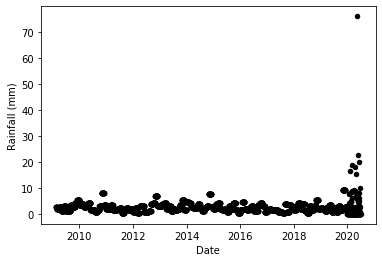

In [304]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

In [305]:
rain_df.iloc[3965:3970]

,Date,Rainfall_Terni
3965,2019-12-31,2.6
3966,2020-01-01,2.2
3967,2020-01-02,0.2
3968,2020-01-03,0.0
3969,2020-01-04,0.0


In [306]:
rains_2020 = rain_df.iloc[3966:]

In [307]:
rains_2020['Rainfall_Terni'] = rains_2020.groupby(pd.Grouper(key='Date', freq='M')).transform('mean')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [308]:
rain_df.Rainfall_Terni.iloc[3966:] = rains_2020.Rainfall_Terni.iloc[:]


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [309]:
train.Rainfall_Terni.iloc[3966:] = rain_df.Rainfall_Terni.iloc[3966:]

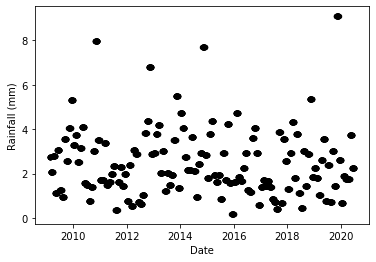

In [310]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

In [311]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

In [312]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

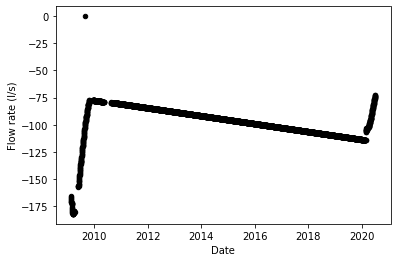

In [313]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        if i == 0:
            ax1 = flow_df.plot.scatter(x = 'Date', y = f'{flows[i]}', color=colours[i])
        else:
            axes = flow_df.plot.scatter(x = 'Date', y = f'{flows[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Flow rate (l/s)')
        i += 1

In [314]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [315]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        train[f'{flows[i]}'].replace(0, np.nan, inplace=True)
        i += 1
        
# 0s in flows are errors, so replace them with Nans

In [316]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        train[f'{flows[i]}'] = train[f'{flows[i]}']\
        .fillna(train[f'{flows[i]}'].rolling(100, min_periods=1).mean())
        i += 1

In [317]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column    

In [318]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [319]:
imputer = MissForest()
train_copy = train_orig.copy()
if len(depths)>0:
    i = 0
    while i<len(depths):
        train_copy[f'{depths[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in depths are errors, so replace them with Nans
    train_copy = train_copy.drop(['Date'], axis=1)
    col_list = list(train_copy)
    imputs = imputer.fit_transform(train_copy)
    imputs = pd.DataFrame(data=imputs, columns=col_list)
    imputs['Date']= train_orig['Date']

In [320]:
days_ahead = 7

In [321]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs

In [322]:
train_rf = train.copy()
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')
if len(flows)>0:
    for f in flows:
        train_rf[f + '_week_lag'] = train_rf[f].shift(7).astype('float32')
        train_rf[f + '_month_lag'] = train_rf[f].shift(30).astype('float32')
        train_rf[f + '_bimonth_lag'] = train_rf[f].shift(60).astype('float32')
        train_rf[f + '_quarter_lag'] = train_rf[f].shift(90).astype('float32')

In [323]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [324]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [325]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestRegressor(max_depth=30, random_state=2)

In [326]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [327]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


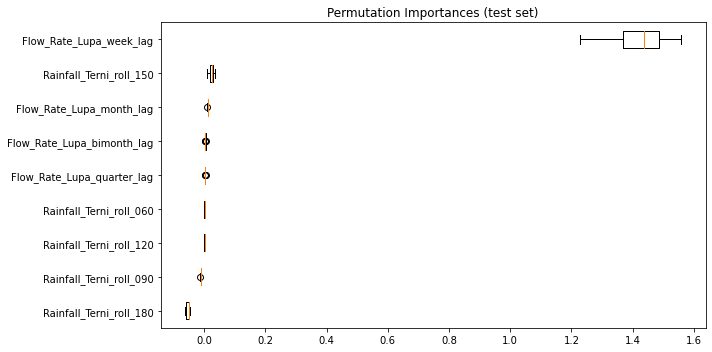

In [328]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [329]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([3.12659422])

In [330]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([4.54887016])

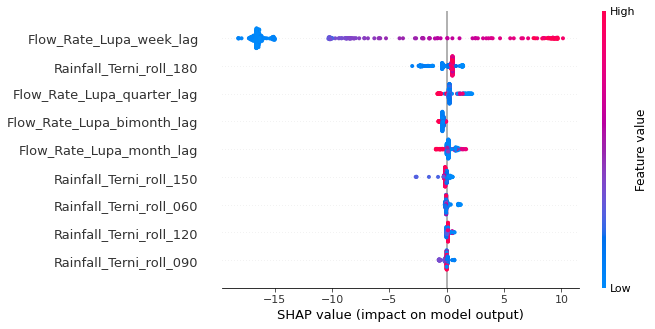

In [331]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [332]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

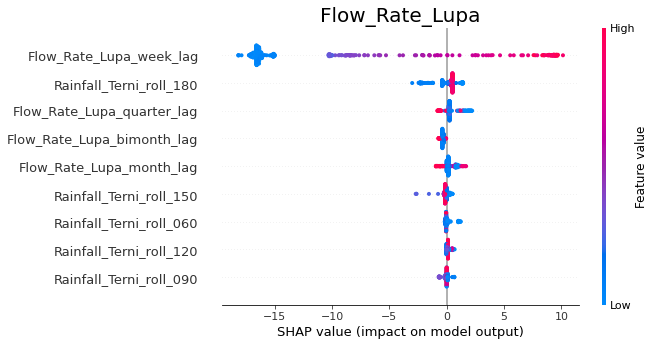

In [333]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [334]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

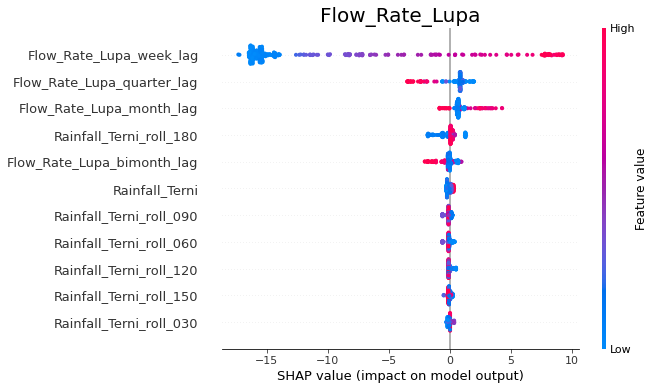

In [335]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [336]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([4.29971034])

In [337]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([5.81347072])

In [338]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [339]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(3774, 7, 2) (3774, 1)
(352, 7, 2) (352, 1)


In [340]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [341]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([2.03479919])

In [342]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([2.60697122])

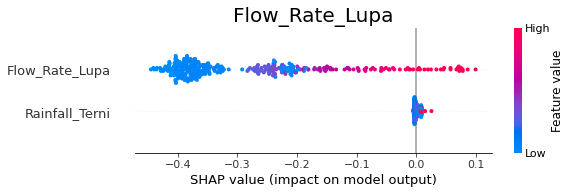

In [343]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [344]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [345]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([3.17624307])

In [346]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([4.34872852])

In [347]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([2.03479919])

In [348]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([2.97438885])

# Water spring Madonna di Canneto

In [349]:
train=pd.read_csv('../input/acea-water-prediction/Water_Spring_Madonna_di_Canneto.csv', parse_dates=['Date'], dayfirst=True)
train_orig = train.copy()
train.head()

,Date,Rainfall_Settefrati,Temperature_Settefrati,Flow_Rate_Madonna_di_Canneto
0,2012-01-01,0.0,5.25,NaN
1,2012-01-02,5.6,6.65,NaN
2,2012-01-03,10.0,8.85,NaN
3,2012-01-04,0.0,6.75,NaN
4,2012-01-05,1.0,5.55,NaN


In [350]:
train.tail()

,Date,Rainfall_Settefrati,Temperature_Settefrati,Flow_Rate_Madonna_di_Canneto
3108,NaT,NaN,NaN,NaN
3109,NaT,NaN,NaN,NaN
3110,NaT,NaN,NaN,NaN
3111,NaT,NaN,NaN,NaN
3112,NaT,NaN,NaN,NaN


In [351]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3113 entries, 0 to 3112
Data columns (total 4 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          3104 non-null   datetime64[ns]
 1   Rainfall_Settefrati           2557 non-null   float64       
 2   Temperature_Settefrati        2557 non-null   float64       
 3   Flow_Rate_Madonna_di_Canneto  1387 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 97.4 KB


In [352]:
targets = ['Flow_Rate_Madonna_di_Canneto']

In [353]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

In [354]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [355]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

In [356]:
depth_df = train.filter(regex=("Depth_to_Groundwater.*"))
depths = depth_df.columns.tolist()
depth_df.insert(0, column = 'Date', value = train['Date'])

In [357]:
temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

In [358]:
flow_df = train.filter(regex=("Flow_Rate.*"))
flows = flow_df.columns.tolist()
flow_df.insert(0, column = 'Date', value = train['Date'])

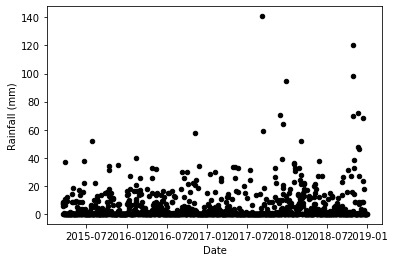

In [359]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

In [360]:
if len(depths)>0:
    i = 0
    while i<len(depths):
        if i == 0:
            ax1 = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i])
        else:
            axes = depth_df.plot.scatter(x = 'Date', y = f'{depths[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Depth to groundwater (m)')
        i += 1

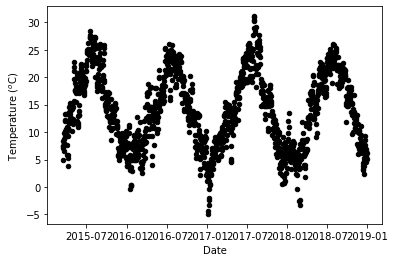

In [361]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

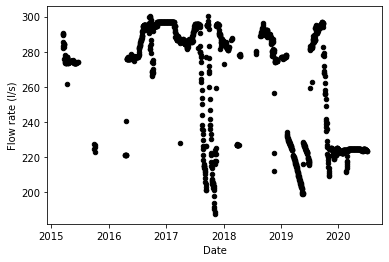

In [362]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        if i == 0:
            ax1 = flow_df.plot.scatter(x = 'Date', y = f'{flows[i]}', color=colours[i])
        else:
            axes = flow_df.plot.scatter(x = 'Date', y = f'{flows[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Flow rate (l/s)')
        i += 1

In [363]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [364]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        train[f'{flows[i]}'].replace(0, np.nan, inplace=True)
        i += 1
        
# 0s in flows are errors, so replace them with Nans

In [365]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        train[f'{flows[i]}'] = train[f'{flows[i]}']\
        .fillna(train[f'{flows[i]}'].rolling(100, min_periods=1).mean())
        i += 1

In [366]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column    


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


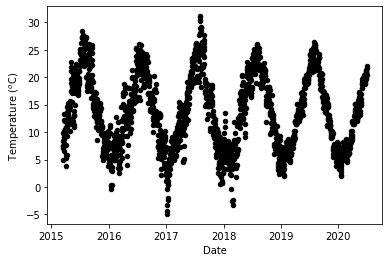

In [367]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [368]:
imputer = MissForest()
train_copy = train_orig.copy()
if len(depths)>0:
    i = 0
    while i<len(depths):
        train_copy[f'{depths[i]}'].replace(0, np.nan, inplace=True)
        i += 1
# 0s in depths are errors, so replace them with Nans
    train_copy = train_copy.drop(['Date'], axis=1)
    col_list = list(train_copy)
    imputs = imputer.fit_transform(train_copy)
    imputs = pd.DataFrame(data=imputs, columns=col_list)
    imputs['Date']= train_orig['Date']

In [369]:
days_ahead = 7

In [370]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs

In [371]:
train_rf = train.copy()
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')
if len(flows)>0:
    for f in flows:
        train_rf[f + '_week_lag'] = train_rf[f].shift(7).astype('float32')
        train_rf[f + '_month_lag'] = train_rf[f].shift(30).astype('float32')
        train_rf[f + '_bimonth_lag'] = train_rf[f].shift(60).astype('float32')
        train_rf[f + '_quarter_lag'] = train_rf[f].shift(90).astype('float32')

In [372]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [373]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [374]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestRegressor(max_depth=30, random_state=2)

In [375]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [376]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


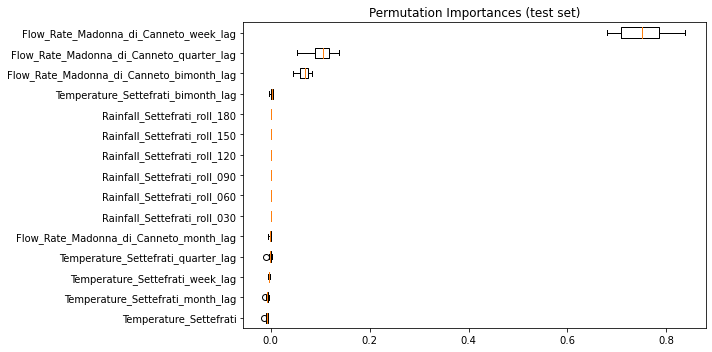

In [377]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [378]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([11.33586067])

In [379]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([18.12517298])

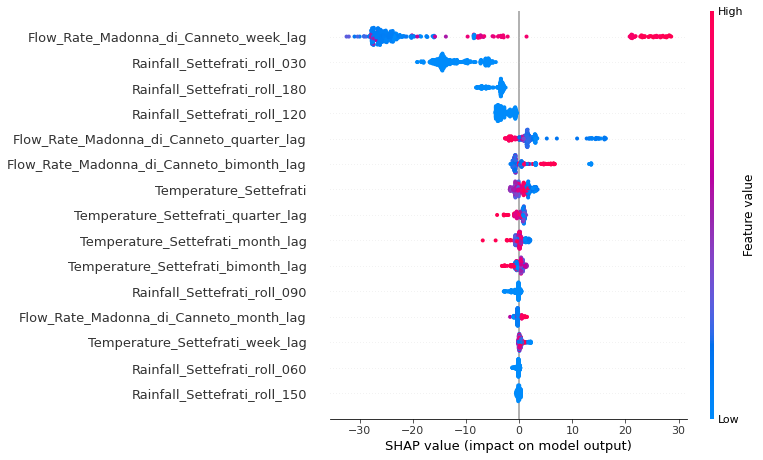

In [380]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [381]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

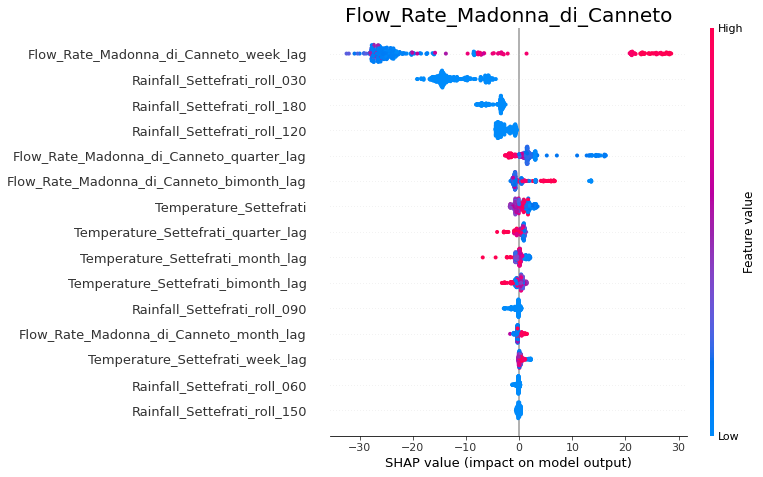

In [382]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [383]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

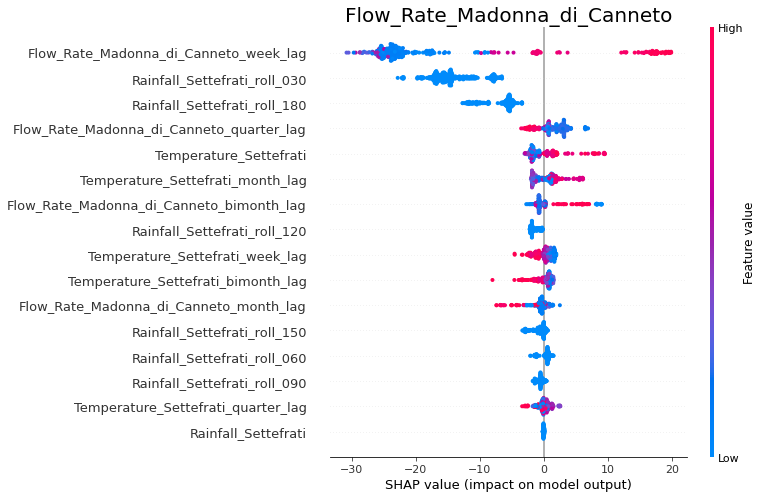

In [384]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [385]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([12.41052563])

In [386]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([19.99533661])

In [387]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [388]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(1459, 7, 3) (1459, 1)
(359, 7, 3) (359, 1)


In [389]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [390]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([14.63358095])

In [391]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([19.88290996])

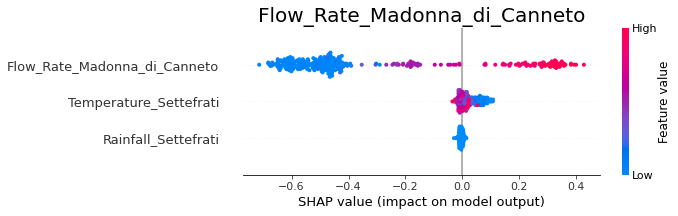

In [392]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [393]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [394]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([11.47071653])

In [395]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([12.43820251])

In [396]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([14.63358095])

In [397]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([10.32704821])

# River Arno

In [398]:
# Load the dataset
train = pd.read_csv('../input/acea-water-prediction/River_Arno.csv', parse_dates=['Date'], dayfirst=True)
# Create a copy of the original data, since the 'train' dataframe will be modified
train_orig = train.copy()
train.head()

,Date,Rainfall_Le_Croci,Rainfall_Cavallina,Rainfall_S_Agata,Rainfall_Mangona,Rainfall_S_Piero,Rainfall_Vernio,Rainfall_Stia,Rainfall_Consuma,Rainfall_Incisa,Rainfall_Montevarchi,Rainfall_S_Savino,Rainfall_Laterina,Rainfall_Bibbiena,Rainfall_Camaldoli,Temperature_Firenze,Hydrometry_Nave_di_Rosano
0,1998-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.82
1,1998-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.94
2,1998-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.11
3,1998-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.84
4,1998-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.88


In [399]:
train.tail()

,Date,Rainfall_Le_Croci,Rainfall_Cavallina,Rainfall_S_Agata,Rainfall_Mangona,Rainfall_S_Piero,Rainfall_Vernio,Rainfall_Stia,Rainfall_Consuma,Rainfall_Incisa,Rainfall_Montevarchi,Rainfall_S_Savino,Rainfall_Laterina,Rainfall_Bibbiena,Rainfall_Camaldoli,Temperature_Firenze,Hydrometry_Nave_di_Rosano
8212,2020-06-26,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.34
8213,2020-06-27,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.21
8214,2020-06-28,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.30
8215,2020-06-29,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.19
8216,2020-06-30,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.30


In [400]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8217 entries, 0 to 8216
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8217 non-null   datetime64[ns]
 1   Rainfall_Le_Croci          6026 non-null   float64       
 2   Rainfall_Cavallina         6026 non-null   float64       
 3   Rainfall_S_Agata           6026 non-null   float64       
 4   Rainfall_Mangona           6026 non-null   float64       
 5   Rainfall_S_Piero           6026 non-null   float64       
 6   Rainfall_Vernio            4283 non-null   float64       
 7   Rainfall_Stia              1283 non-null   float64       
 8   Rainfall_Consuma           1283 non-null   float64       
 9   Rainfall_Incisa            4568 non-null   float64       
 10  Rainfall_Montevarchi       1647 non-null   float64       
 11  Rainfall_S_Savino          1283 non-null   float64       
 12  Rainfa

In [401]:
targets = ['Hydrometry_Nave_di_Rosano']

In [402]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

In [403]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [404]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

hydro_df = train.filter(regex=("Hydrometry.*"))
hydros = hydro_df.columns.tolist()
hydro_df.insert(0, column = 'Date', value = train['Date'])

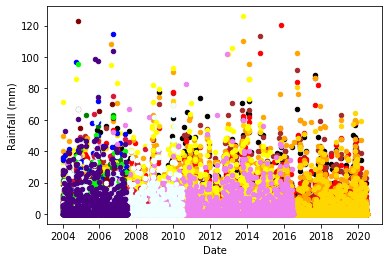

In [405]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

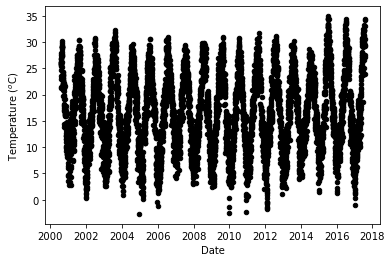

In [406]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

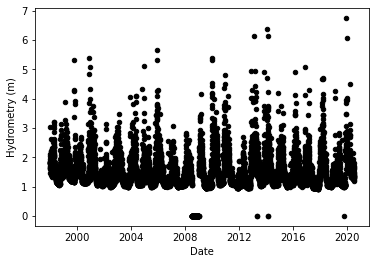

In [407]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = hydro_df.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [408]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [409]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column   


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


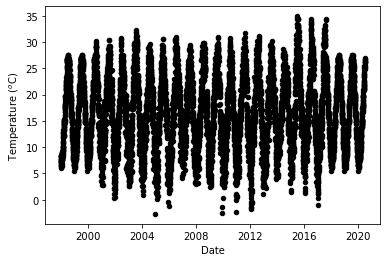

In [410]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [411]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        train[f'{hydros[i]}'].replace(0, np.nan, inplace=True)
        i += 1

# 0s in hydrometry are errors, so replace them with Nans

In [412]:
hydro_df2 = train.filter(regex=("Hydrometry.*"))
hydros = hydro_df2.columns.tolist()
hydro_df2.insert(0, column = 'Date', value = train['Date'])

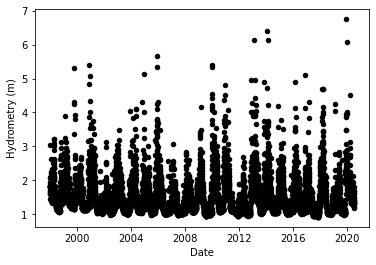

In [413]:
if len(hydros)>0:
    i = 0
    while i<len(hydros):
        X = pd.DataFrame(hydro_df2.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{hydros[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{hydros[i]}'].to_dict())
        X.loc[X[f'{hydros[i]}'].isnull() == False, 'same_day'] = X[f'{hydros[i]}']
        X.loc[X[f'{hydros[i]}'].isnull() == True, f'{hydros[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{hydros[i]}'].isnull() == False, f'{hydros[i]}' + '_new'] = X[f'{hydros[i]}']
    
        train[f'{hydros[i]}'].update(X[f'{hydros[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(hydros):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{hydros[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Hydrometry (m)')
        i += 1

In [414]:
days_ahead = 7

In [415]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs

In [416]:
train_rf = train.copy()
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(depths)>0:
    for d in depths:
        train_rf[d + '_week_lag'] = train_rf[d].shift(7).astype('float32')
        train_rf[d + '_month_lag'] = train_rf[d].shift(30).astype('float32')
        train_rf[d + '_bimonth_lag'] = train_rf[d].shift(60).astype('float32')
        train_rf[d + '_quarter_lag'] = train_rf[d].shift(90).astype('float32')

In [417]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [418]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [419]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestRegressor(max_depth=30, random_state=2)

In [420]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [421]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


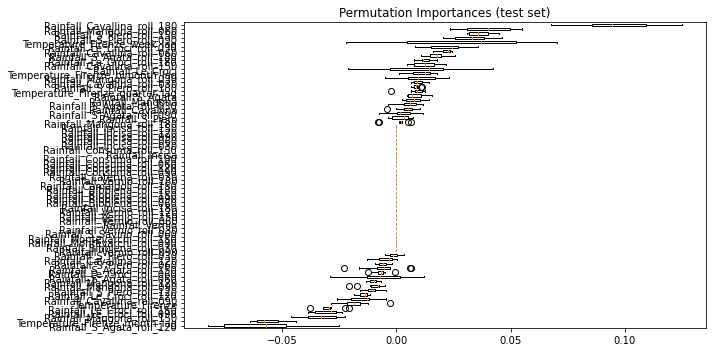

In [422]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [423]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([0.35879279])

In [424]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([0.59274689])

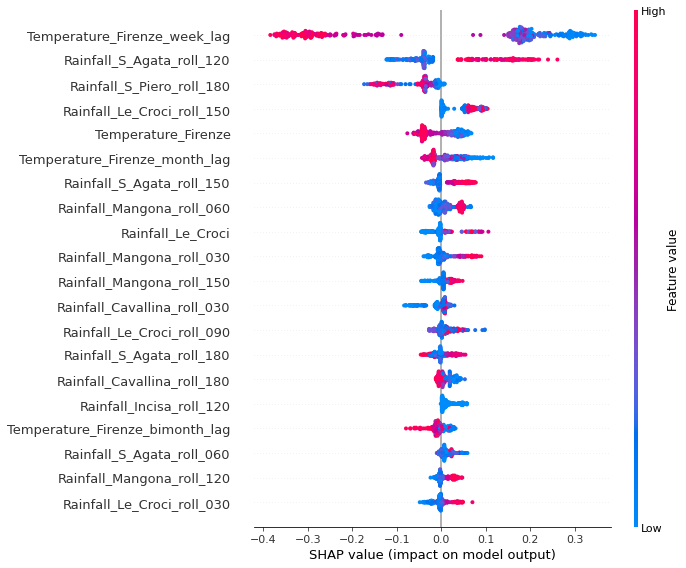

In [425]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [426]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

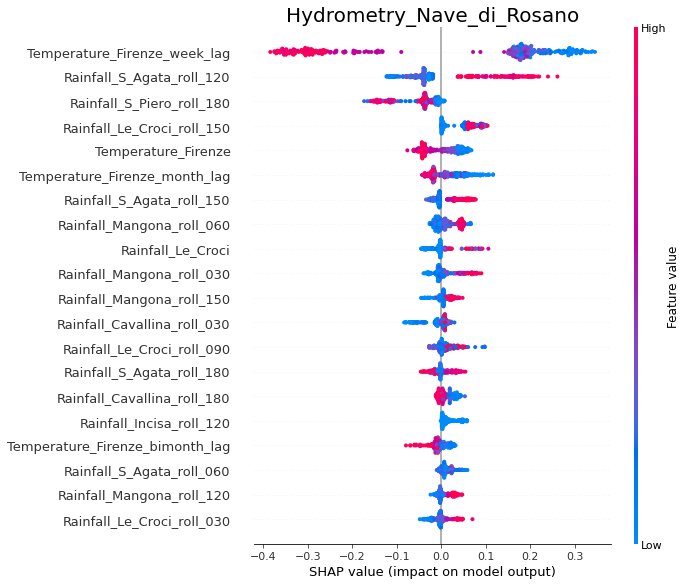

In [427]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [428]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

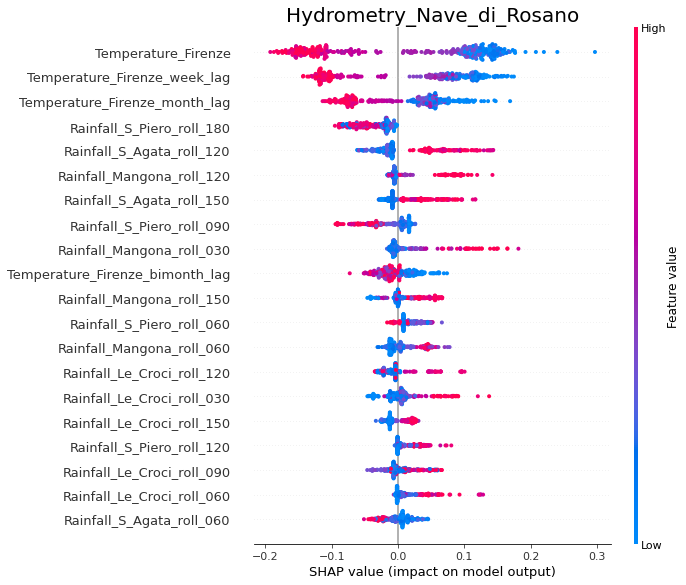

In [429]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [430]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([0.31528631])

In [431]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([0.57177678])

In [432]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [433]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(7840, 7, 16) (7840, 1)
(352, 7, 16) (352, 1)


In [434]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [435]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.35727266])

In [436]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([0.66969075])

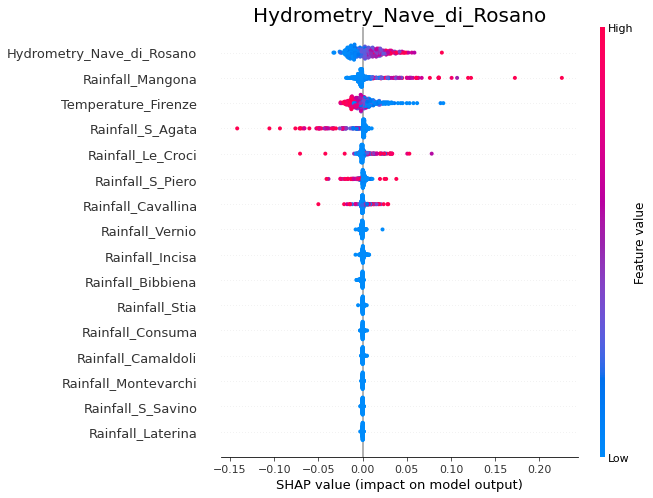

In [437]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [438]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [439]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([0.36437004])

In [440]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([0.31968603])

In [441]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.35727266])

In [442]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([0.31736681])

# Lake Bilancino

In [443]:
train=pd.read_csv('../input/acea-water-prediction/Lake_Bilancino.csv', parse_dates=['Date'], dayfirst=True)
train_orig = train.copy()
train.head()

,Date,Rainfall_S_Piero,Rainfall_Mangona,Rainfall_S_Agata,Rainfall_Cavallina,Rainfall_Le_Croci,Temperature_Le_Croci,Lake_Level,Flow_Rate
0,2002-06-03,NaN,NaN,NaN,NaN,NaN,NaN,249.43,0.31
1,2002-06-04,NaN,NaN,NaN,NaN,NaN,NaN,249.43,0.31
2,2002-06-05,NaN,NaN,NaN,NaN,NaN,NaN,249.43,0.31
3,2002-06-06,NaN,NaN,NaN,NaN,NaN,NaN,249.43,0.31
4,2002-06-07,NaN,NaN,NaN,NaN,NaN,NaN,249.44,0.31


In [444]:
train.tail()

,Date,Rainfall_S_Piero,Rainfall_Mangona,Rainfall_S_Agata,Rainfall_Cavallina,Rainfall_Le_Croci,Temperature_Le_Croci,Lake_Level,Flow_Rate
6598,2020-06-26,0.0,0.0,0.0,0.0,0.0,22.50,250.85,0.6
6599,2020-06-27,0.0,0.0,0.0,0.0,0.0,23.40,250.84,0.6
6600,2020-06-28,0.0,0.0,0.0,0.0,0.0,21.50,250.83,0.6
6601,2020-06-29,0.0,0.0,0.0,0.0,0.0,23.20,250.82,0.6
6602,2020-06-30,0.0,0.0,0.0,0.0,0.0,22.75,250.80,0.6


In [445]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6603 entries, 0 to 6602
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Date                  6603 non-null   datetime64[ns]
 1   Rainfall_S_Piero      6026 non-null   float64       
 2   Rainfall_Mangona      6026 non-null   float64       
 3   Rainfall_S_Agata      6026 non-null   float64       
 4   Rainfall_Cavallina    6026 non-null   float64       
 5   Rainfall_Le_Croci     6026 non-null   float64       
 6   Temperature_Le_Croci  6025 non-null   float64       
 7   Lake_Level            6603 non-null   float64       
 8   Flow_Rate             6582 non-null   float64       
dtypes: datetime64[ns](1), float64(8)
memory usage: 464.4 KB


In [446]:
targets = ['Lake_Level', 'Flow_Rate']

In [447]:
def is_leap_and_29Feb(s):
    return (s.Date.dt.year % 4 == 0) & \
           ((s.Date.dt.year % 100 != 0) | (s.Date.dt.year % 400 == 0)) & \
           (s.Date.dt.month == 2) & (s.Date.dt.day == 29)

mask = is_leap_and_29Feb(train)

train = train.loc[~mask]

In [448]:
i = 0
nan_len = []
while i<len(targets):
    nan_len.append(train[f'{targets[i]}'].notna().idxmax())
    i += 1

train = train.iloc[max(nan_len):].reset_index(drop = True)

In [449]:
rain_df = train.filter(regex=("Rainfall.*"))
rains = rain_df.columns.tolist()
rain_df.insert(0, column = 'Date', value = train['Date'])

In [450]:
temp_df = train.filter(regex=("Temperature.*"))
temps = temp_df.columns.tolist()
temp_df.insert(0, column = 'Date', value = train['Date'])

In [451]:
level_df = train.filter(regex=("Lake_Level.*"))
levels = level_df.columns.tolist()
level_df.insert(0, column = 'Date', value = train['Date'])

In [452]:
flow_df = train.filter(regex=("Flow_Rate.*"))
flows = flow_df.columns.tolist()
flow_df.insert(0, column = 'Date', value = train['Date'])

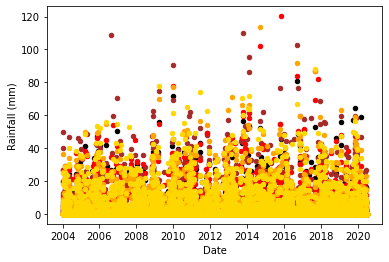

In [453]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        if i == 0:
            ax1 = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i])
        else:
            axes = rain_df.plot.scatter(x = 'Date', y = f'{rains[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Rainfall (mm)')
        i += 1

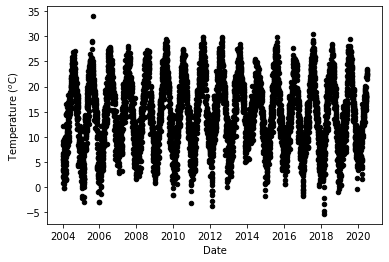

In [454]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = temp_df.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

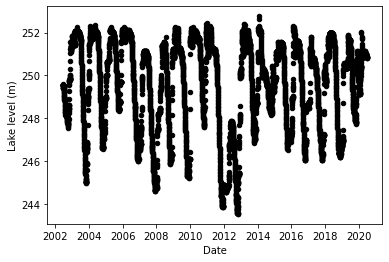

In [455]:
if len(levels)>0:
    i = 0
    while i<len(levels):
        if i == 0:
            ax1 = level_df.plot.scatter(x = 'Date', y = f'{levels[i]}', color=colours[i])
        else:
            axes = level_df.plot.scatter(x = 'Date', y = f'{levels[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Lake level (m)')
        i += 1

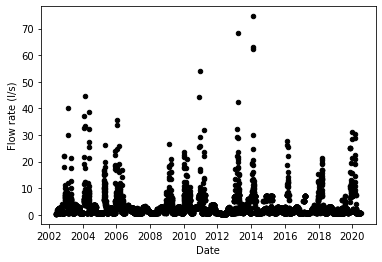

In [456]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        if i == 0:
            ax1 = flow_df.plot.scatter(x = 'Date', y = f'{flows[i]}', color=colours[i])
        else:
            axes = flow_df.plot.scatter(x = 'Date', y = f'{flows[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Flow rate (l/s)')
        i += 1

In [457]:
if len(rains)>0:
    i = 0
    while i<len(rains):
        train[f'{rains[i]}'] = train[f'{rains[i]}'].fillna(0)
        i += 1

In [458]:
if len(flows)>0:
    i = 0
    while i<len(flows):
        train[f'{flows[i]}'] = train[f'{flows[i]}'].fillna(0)
        i += 1

In [459]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        a = train[f'{temps[i]}'] == 0
        mask = a.cumsum()-a.cumsum().where(~a).ffill().fillna(0) >= 7
        train[f'{temps[i]}'] = train[f'{temps[i]}'].mask(mask, np.nan)
        temp_df[f'{temps[i]}'] = temp_df[f'{temps[i]}'].mask(mask, np.nan)
        i += 1
        
# Replacing 7 or more 0 temperature values with Nans
# Taken from 
#https://stackoverflow.com/questions/42946226/replacing-more-than-n-consecutive-values-in-pandas-dataframe-column 


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


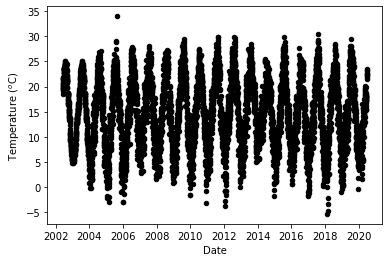

In [460]:
if len(temps)>0:
    i = 0
    while i<len(temps):
        X = pd.DataFrame(temp_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{temps[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{temps[i]}'].to_dict())
        X.loc[X[f'{temps[i]}'].isnull() == False, 'same_day'] = X[f'{temps[i]}']
        X.loc[X[f'{temps[i]}'].isnull() == True, f'{temps[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{temps[i]}'].isnull() == False, f'{temps[i]}' + '_new'] = X[f'{temps[i]}']
    
        train[f'{temps[i]}'].update(X[f'{temps[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(temps):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{temps[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Temperature ($^o$C)')
        i += 1

In [461]:
if len(levels)>0:
    i = 0
    while i<len(levels):
        train[f'{levels[i]}'].replace(0, np.nan, inplace=True)
        i += 1

# 0s in lake level are errors, so replace them with Nans

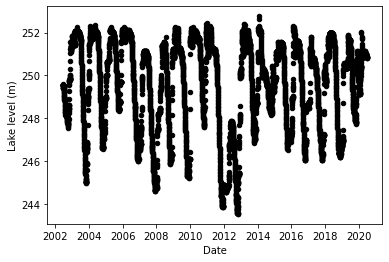

In [462]:
if len(levels)>0:
    i = 0
    while i<len(levels):
        X = pd.DataFrame(level_df.iloc[:, np.r_[0,i+1]])
        X['dayofyear'] = X['Date'].dt.dayofyear
        X2 = X.groupby('dayofyear').mean()
        X2.reset_index(level=0, inplace=True)
        X.loc[X[f'{levels[i]}'].isnull() == True, 'same_day'] =\
        X['dayofyear'].map(X2.set_index('dayofyear')[f'{levels[i]}'].to_dict())
        X.loc[X[f'{levels[i]}'].isnull() == False, 'same_day'] = X[f'{levels[i]}']
        X.loc[X[f'{levels[i]}'].isnull() == True, f'{levels[i]}' + '_new'] = X['same_day']
        X.loc[X[f'{levels[i]}'].isnull() == False, f'{levels[i]}' + '_new'] = X[f'{levels[i]}']
    
        train[f'{levels[i]}'].update(X[f'{levels[i]}' + '_new'])
    
        i += 1
          
    i = 0
    while i<len(levels):
        if i == 0:
            ax1 = train.plot.scatter(x = 'Date', y = f'{levels[i]}', color=colours[i])
        else:
            axes = train.plot.scatter(x = 'Date', y = f'{levels[i]}', color=colours[i], ax = ax1)
        y_axis = ax1.yaxis
        y_axis.set_label_text('Lake level (m)')
        i += 1

In [463]:
days_ahead = 7

In [464]:
target_cols = targets.copy()
i = 0
for target in targets:
    train[target + '_target'] = train[target].shift(-days_ahead)
    target_cols[i] = target + '_target'
    i += 1
# Creating new columns by shifting the target columns by the forecast period
train = train.dropna()
# Required as the shift in the cell above introduces some new NaNs

In [465]:
train_rf = train.copy()
if len(rains)>0:
    for r in rains:
        train_rf[r + '_roll_030'] = train_rf[r].rolling(30).mean().astype('float32')
        train_rf[r + '_roll_060'] = train_rf[r].rolling(60).mean().astype('float32')
        train_rf[r + '_roll_090'] = train_rf[r].rolling(90).mean().astype('float32')
        train_rf[r + '_roll_120'] = train_rf[r].rolling(120).mean().astype('float32')
        train_rf[r + '_roll_150'] = train_rf[r].rolling(150).mean().astype('float32')
        train_rf[r + '_roll_180'] = train_rf[r].rolling(180).mean().astype('float32')
if len(temps)>0:
    for t in temps:
        train_rf[t + '_week_lag'] = train_rf[t].shift(7).astype('float32')
        train_rf[t + '_month_lag'] = train_rf[t].shift(30).astype('float32')
        train_rf[t + '_bimonth_lag'] = train_rf[t].shift(60).astype('float32')
        train_rf[t + '_quarter_lag'] = train_rf[t].shift(90).astype('float32')
if len(levels)>0:
    for l in levels:
        train_rf[l + '_week_lag'] = train_rf[l].shift(7).astype('float32')
        train_rf[l + '_month_lag'] = train_rf[l].shift(30).astype('float32')
        train_rf[l + '_bimonth_lag'] = train_rf[l].shift(60).astype('float32')
        train_rf[l + '_quarter_lag'] = train_rf[l].shift(90).astype('float32')
if len(flows)>0:
    for f in flows:
        train_rf[f + '_roll_030'] = train_rf[f].rolling(30).mean().astype('float32')
        train_rf[f + '_roll_060'] = train_rf[f].rolling(60).mean().astype('float32')
        train_rf[f + '_roll_090'] = train_rf[f].rolling(90).mean().astype('float32')
        train_rf[f + '_roll_120'] = train_rf[f].rolling(120).mean().astype('float32')
        train_rf[f + '_roll_150'] = train_rf[f].rolling(150).mean().astype('float32')
        train_rf[f + '_roll_180'] = train_rf[f].rolling(180).mean().astype('float32')

In [466]:
i = 0
for target in targets:
    train_rf = train_rf.drop([f'{targets[i]}'], axis=1)
    i +=1
# If the target columns are not removed, the RF just focuses on them.
train_rf = train_rf.loc[train_rf.dropna().index[0]:].reset_index(drop = True)

In [467]:
rf_X = train_rf[train_rf.columns.difference(target_cols)]
rf_y = train_rf[target_cols]
train_rf_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_rf_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_rf_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
col_list2 = list(train_rf.columns)
train_rf_X = train_rf_X.drop(['Date'], axis=1)
test_rf_X = test_rf_X.drop(['Date'], axis=1)
# The Date column needs to be removed for the RF regressor to work

In [468]:
regr_rf = RandomForestRegressor(n_estimators=100, max_depth=30, random_state=2)
regr_rf.fit(train_rf_X, train_rf_y)

RandomForestRegressor(max_depth=30, random_state=2)

In [469]:
# Calculating permutation importance based on the previous RF
train_val_rf = permutation_importance(regr_rf, train_rf_X, train_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val = train_val_rf.importances_mean.argsort()

# Taking the important features from the random forest above
var_names = train_rf_X.columns[sorted_idx_val].to_frame()
imps = sorted(train_val_rf.importances_mean)
var_names = var_names.assign(imps = imps)
var_names = var_names.rename(columns={0: "vars"})

# Making a list containing the most important variables. The feature importance value of 0.001
# is arbitrary and can be changed if needed
to_keep = var_names[var_names.imps>0.001].vars.to_list()

# Making new train and test dataframes for the X terms judged important enough to keep
train_rf_X = train_rf_X[[c for c in train_rf_X.columns if c in to_keep]]
test_rf_X = test_rf_X[[c for c in test_rf_X.columns if c in to_keep]]

In [470]:
regr_rf.fit(train_rf_X, train_rf_y)
rf_preds_1 = regr_rf.predict(test_rf_X)

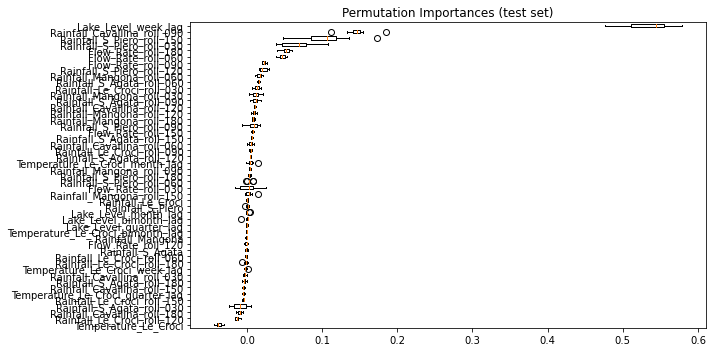

In [471]:
result_val2 = permutation_importance(regr_rf, test_rf_X, test_rf_y, n_repeats=10,
                                random_state=42, n_jobs=-1)
sorted_idx_val2 = result_val2.importances_mean.argsort()

fig1, ax = plt.subplots(figsize=(10,5))
ax.boxplot(result_val2.importances[sorted_idx_val2].T,
           vert=False, labels=test_rf_X.columns[sorted_idx_val2])
ax.set_title("Permutation Importances (test set)")
fig1.tight_layout()
plt.show()

In [472]:
mean_absolute_error(rf_preds_1, test_rf_y, multioutput='raw_values')

array([0.54634543, 2.27555978])

In [473]:
mean_squared_error(rf_preds_1, test_rf_y, multioutput='raw_values', squared=False)

array([0.80603664, 4.58437227])

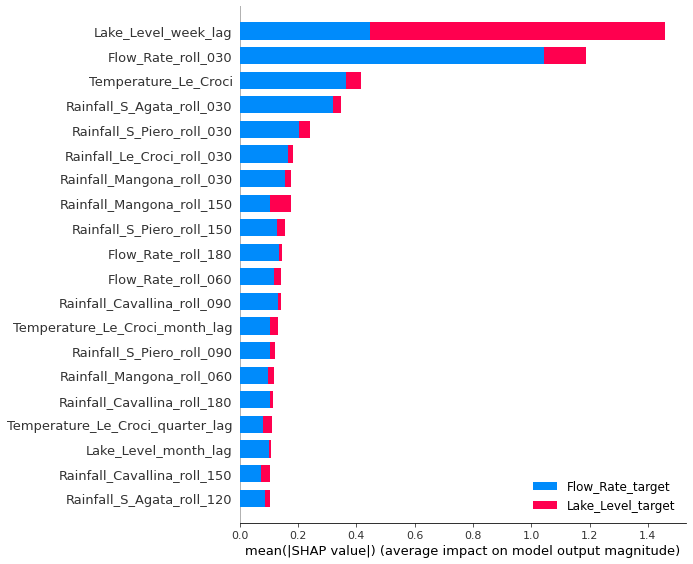

In [474]:
explainer = shap.TreeExplainer(regr_rf)
shap_values = explainer.shap_values(test_rf_X)
class_names=target_cols
shap.summary_plot(shap_values, test_rf_X, class_names=class_names)

In [475]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

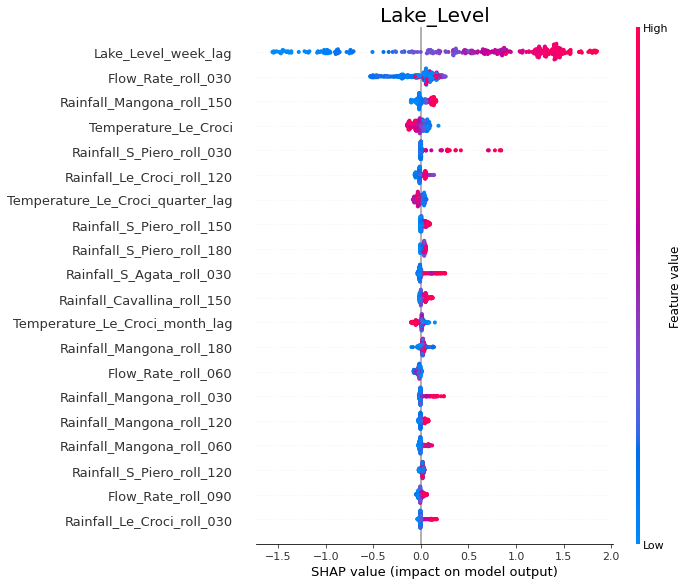

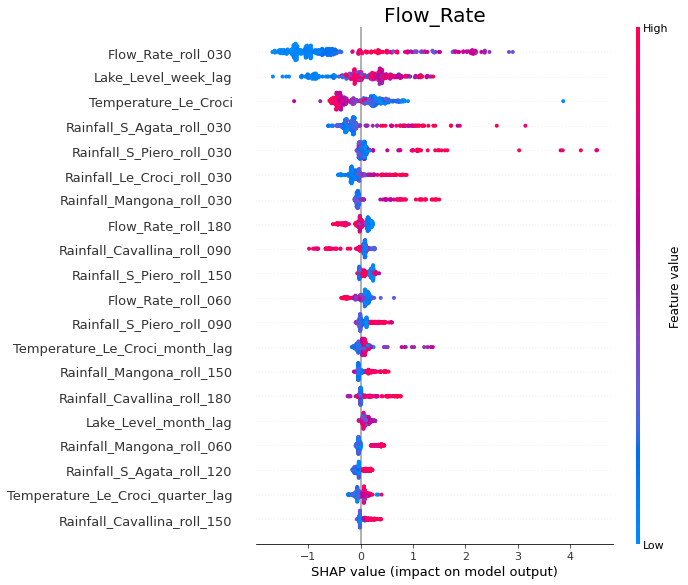

In [476]:
i = 0
for target in targets:
    # To ensure the code works if only target variable is present
    if len(targets) == 1:
        shap.summary_plot(shap_values, test_rf_X, show=False)
    else:
        shap.summary_plot(shap_values[i], test_rf_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [477]:
regr_lgbm = LGBMRegressor()

train_lgbm_X = rf_X.iloc[:rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_X = rf_X.iloc[rf_X.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
train_lgbm_y = rf_y.iloc[:rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item()].reset_index(drop = True)
test_lgbm_y = rf_y.iloc[rf_y.loc[rf_X['Date'] == '2019-07-01'].index.item():].reset_index(drop = True)
# Note that rf_y does not have a Date column, but as it's the same length as rf_X,
# the Date column from that df can be used for the train-test split
train_lgbm_X = train_lgbm_X.drop(['Date'], axis=1)
test_lgbm_X = test_lgbm_X.drop(['Date'], axis=1)

lgbm_preds_1 = np.empty_like(test_lgbm_y)

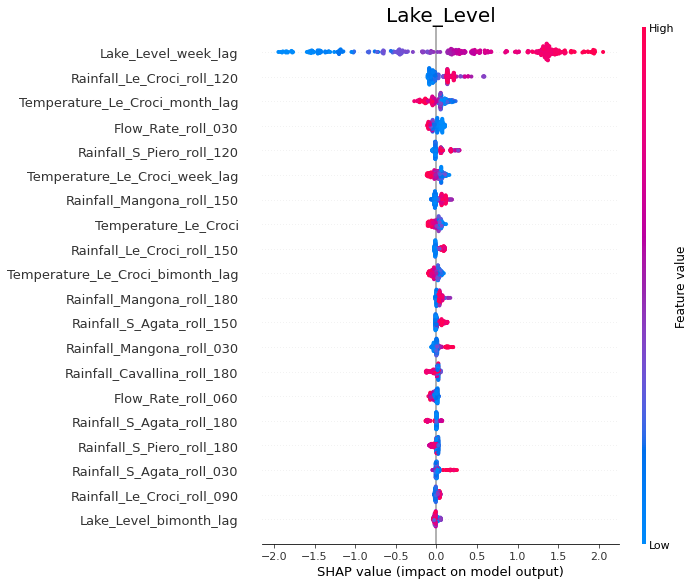

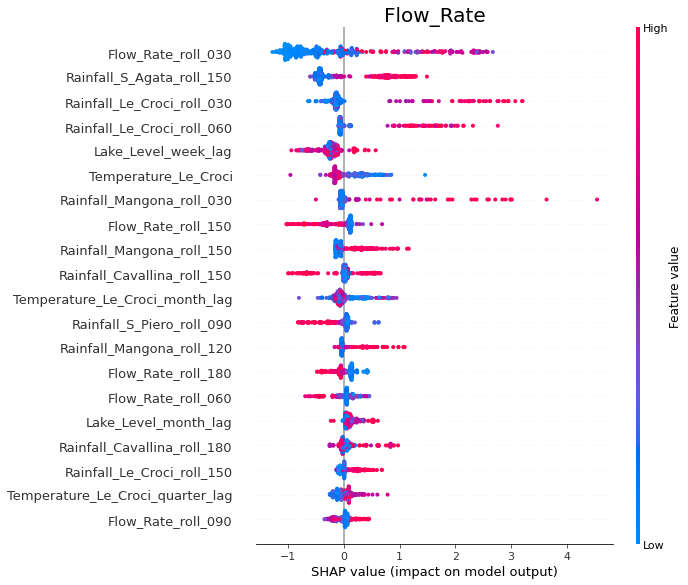

In [478]:
i = 0
for target in targets:
    m1 = regr_lgbm.fit(train_lgbm_X, train_lgbm_y.iloc[:,i])
    lgbm_preds_1[:,i] = m1.predict(test_lgbm_X)
    explainer2 = shap.TreeExplainer(regr_lgbm)
    shap_values = explainer2.shap_values(test_lgbm_X)
    shap.summary_plot(shap_values, test_lgbm_X, show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [479]:
mean_absolute_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values')

array([0.36870644, 2.21657815])

In [480]:
mean_squared_error(lgbm_preds_1, test_lgbm_y, multioutput='raw_values', squared=False)

array([0.54435089, 4.64798524])

In [481]:
# Make a copy of the train dataframe
train_lstm = train.copy()
train_lstm = train_lstm.loc[train_lstm.dropna().index[0]:].reset_index(drop = True)
# Create train-test split, then drop Date columns
train_train_lstm = train_lstm.iloc[:train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item()]
train_test_lstm = train_lstm.iloc[train_lstm.loc[train_lstm['Date'] == '2019-07-01'].index.item():]
train_train_lstm = train_train_lstm.drop(['Date'], axis=1)
train_test_lstm = train_test_lstm.drop(['Date'], axis=1)
# Create a copy of the train test dataframes and perform scaling on thiese dataframes
# Separate scalers used for the train and test sets to prevent the possibility of data leakage
train_train_lstm2 = train_train_lstm.copy()
train_test_lstm2 = train_test_lstm.copy()
scaler1 = MinMaxScaler()
scaler2 = MinMaxScaler()
train_train_lstm2 = scaler1.fit_transform(train_train_lstm2)
train_test_lstm2 = scaler2.fit_transform(train_test_lstm2)

In [482]:
# Split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-len(target_cols)], sequences[end_ix-1, -len(target_cols):]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# Choose number of time steps used for training. Arbitrary, 7 chosen here.
n_steps = 7

# Convert into input/output
X_train, y_train = split_sequences(train_train_lstm2, n_steps)
print(X_train.shape, y_train.shape)
X_test, y_test = split_sequences(train_test_lstm2, n_steps)
print(X_test.shape, y_test.shape)

# The number of features
n_features = X_train.shape[2]

(6227, 7, 8) (6227, 2)
(352, 7, 8) (352, 2)


In [483]:
# Define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(len(target_cols)))
model.compile(optimizer='adam', loss='mse')

# Fit model
model.fit(X_train, y_train, epochs=200, verbose=0)

# Demonstrate prediction
yhat = model.predict(X_test, verbose=0)

# Change X test array dimensions and concatenate with y test and y prediction arrays
X_test_new = X_test[:,0,:]
test_new = np.concatenate((X_test_new, y_test), axis=1)
test_new2 = np.concatenate((X_test_new, yhat), axis=1)

# Scale back the test arrays
test_new = scaler2.inverse_transform(test_new)
test_new2 = scaler2.inverse_transform(test_new2)

# Create target and prediction arrays containing only the target terms, to compare the predictions
y_targets = test_new[:, -len(target_cols):]
lstm_preds_1 = test_new2[:, -len(target_cols):]

In [484]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.26881957, 2.00160976])

In [485]:
mean_squared_error(lstm_preds_1, y_targets, multioutput='raw_values', squared=False)

array([0.44566417, 4.85344031])

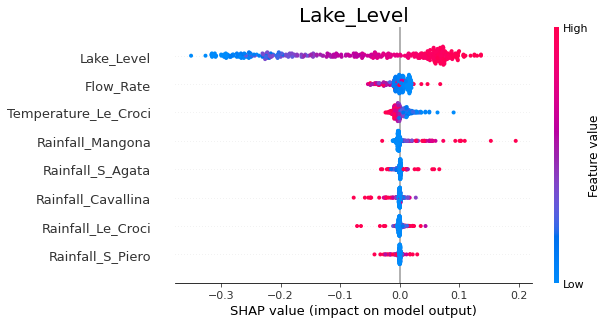

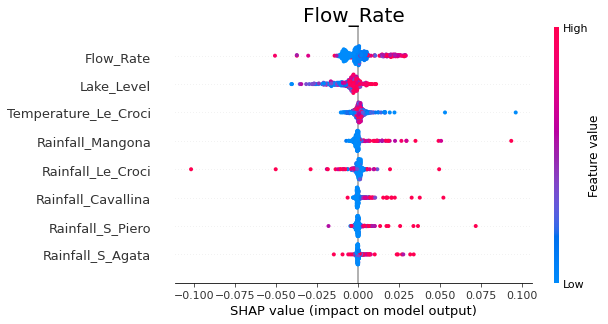

In [486]:
explainer = shap.GradientExplainer(model, X_train)
shap_values1 = explainer.shap_values(X_test)
Xtests = np.hsplit(X_test, n_steps)
i = 0
for target in targets:
    shaps = np.hsplit(shap_values1[i], n_steps)
    shap.summary_plot(np.squeeze(shaps[n_steps-1]), np.squeeze(Xtests[n_steps-1])
                      ,feature_names = train_test_lstm.columns.tolist(), show=False)
    plt.title(f'{targets[i]}', fontsize=20)
    plt.show()
    i +=1

In [487]:
lgbm_preds_1 = lgbm_preds_1.reshape(rf_preds_1.shape)
rf_preds_1 = np.delete(rf_preds_1, np.s_[0:n_steps-1], axis=0)
lgbm_preds_1 = np.delete(lgbm_preds_1, np.s_[0:n_steps-1], axis=0)
lstm_preds_1 = lstm_preds_1.reshape(rf_preds_1.shape)
avg_preds_1 = (rf_preds_1 + lgbm_preds_1 + lstm_preds_1)/3

In [488]:
mean_absolute_error(rf_preds_1, y_targets, multioutput='raw_values')

array([0.55501894, 2.31339858])

In [489]:
mean_absolute_error(lgbm_preds_1, y_targets, multioutput='raw_values')

array([0.37252623, 2.24897815])

In [490]:
mean_absolute_error(lstm_preds_1, y_targets, multioutput='raw_values')

array([0.26881957, 2.00160976])

In [491]:
mean_absolute_error(avg_preds_1, y_targets, multioutput='raw_values')

array([0.35209535, 1.97662556])